<a href="https://colab.research.google.com/github/starlingomez/preworkmac/blob/master/saturday_santos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Seth Lugo

Data loaded successfully. Shape: (11, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (11, 15)

Feature correlations with FIP:
FIP              1.000000
HR/9             0.942144
HR_to_K_ratio    0.936310
xFIP             0.750055
WHIP             0.464651
AVG              0.426345
BB/9             0.405156
BB%              0.366791
TBF              0.293870
LOB%             0.138178
IP              -0.060026
BABIP           -0.091002
K/9             -0.405419
K%              -0.492785
Efficiency      -0.498340
K_per_TBF       -0.513431
K/BB            -0.533525
K-BB%           -0.609117
Name: FIP, dtype: float64


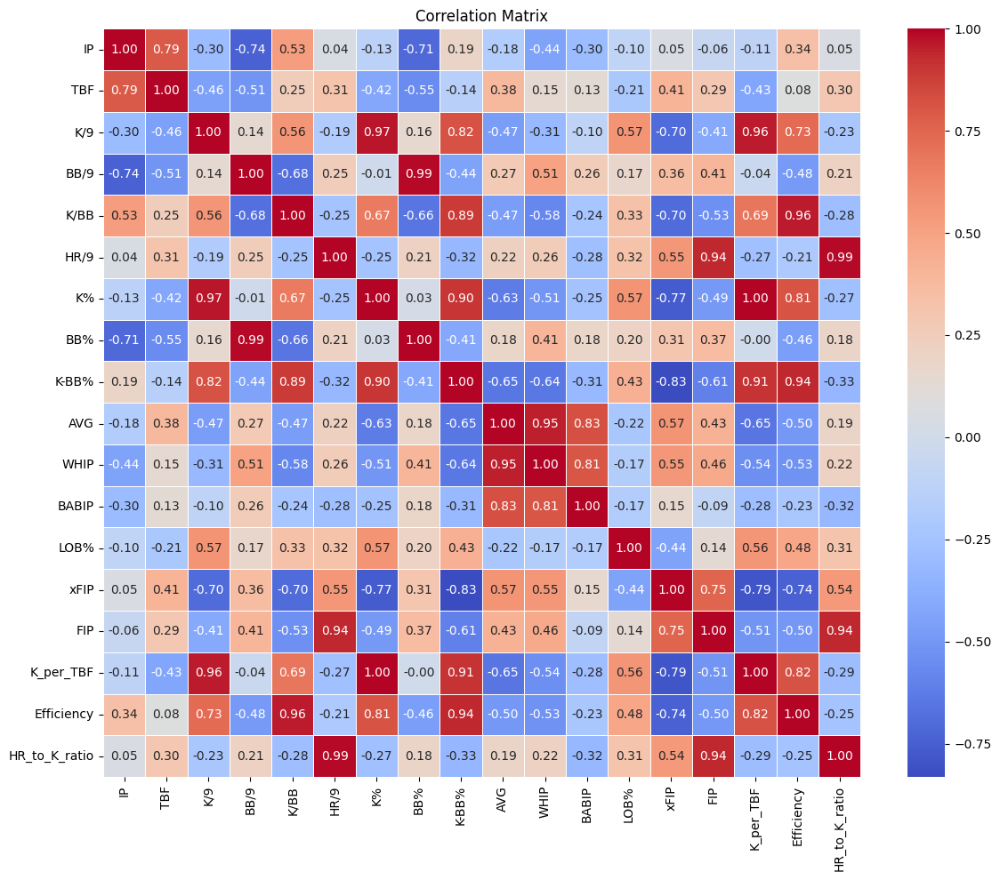


Training set: (8, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0164
Test RMSE: 0.5083
Training R²: 1.0000
Test R²: 0.3770
Test MAE: 0.5038


<Figure size 1200x600 with 0 Axes>

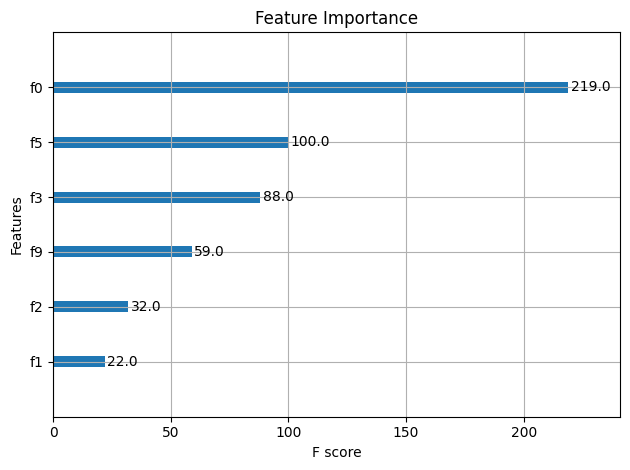


Sample Prediction for Next Game:
Predicted FIP: 1.21
Actual FIP: 1.74
Difference: 0.53

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    1.737908       1.210430
1    3.166480       2.754499
2    3.031383       2.459521

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -3.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.997543
K/9           0.969145
K-BB%         0.900291
efficiency    0.808285
K/BB          0.665823
LOB%          0.567803
IP           -0.130389
HR/9         -0.250418
BABIP        -0.252515
Name: K%, dtype: float64


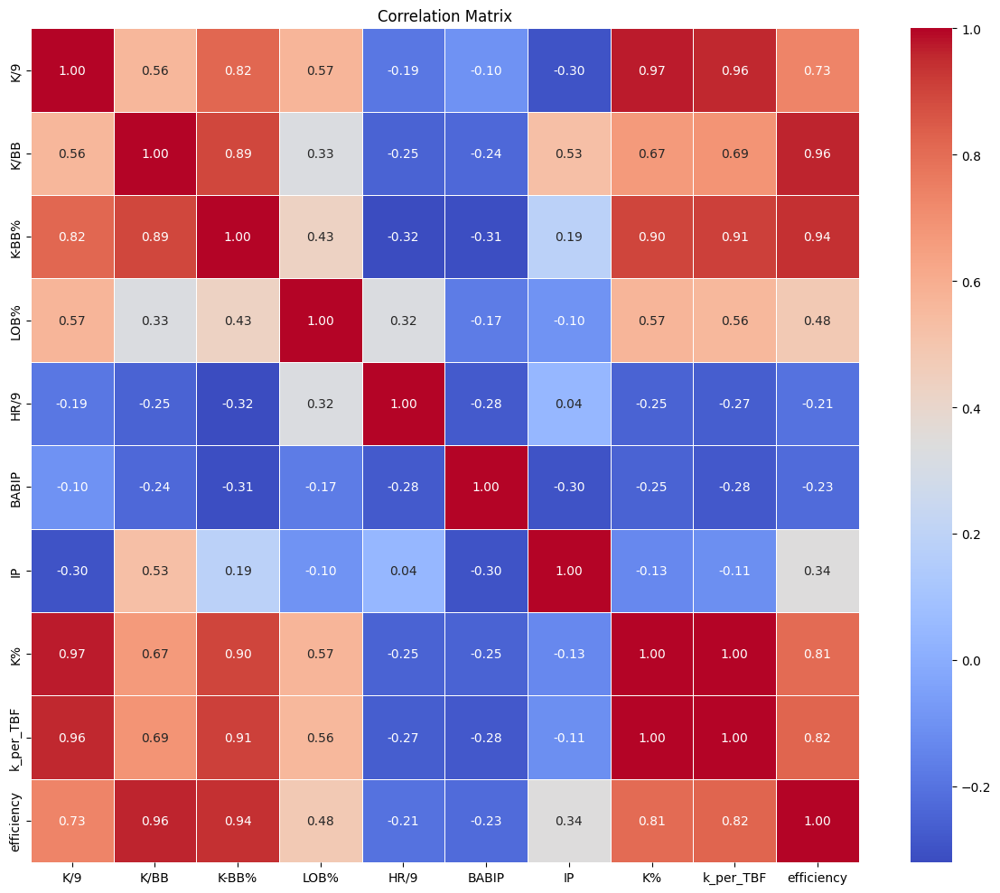


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0587
Training R²: 1.0000
Test R²: 0.0877
Test MAE: 0.0497


<Figure size 1200x600 with 0 Axes>

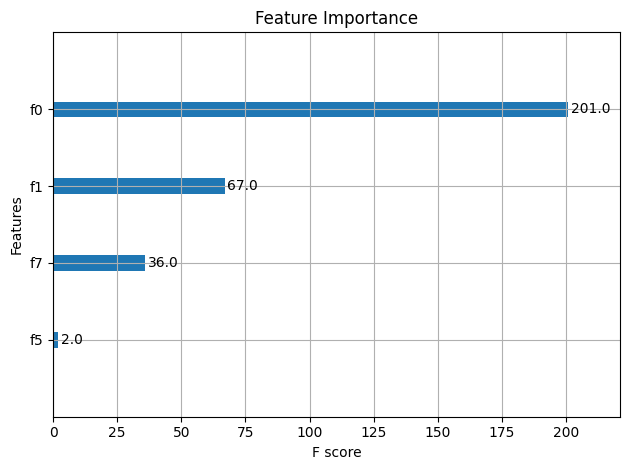


Sample Prediction for Next Game:
Predicted K%: 16.74%
Actual K%: 20.00%
Difference: 3.26%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.200000      0.167428
1   0.111111      0.088196
2   0.260870      0.167255

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -3.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (13, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (13, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.998086
K/9           0.947189
K-BB%         0.919279
efficiency    0.795668
K/BB          0.712209
IP            0.461783
BABIP         0.181000
LOB%          0.104628
HR/9         -0.165134
Name: K%, dtype: float64


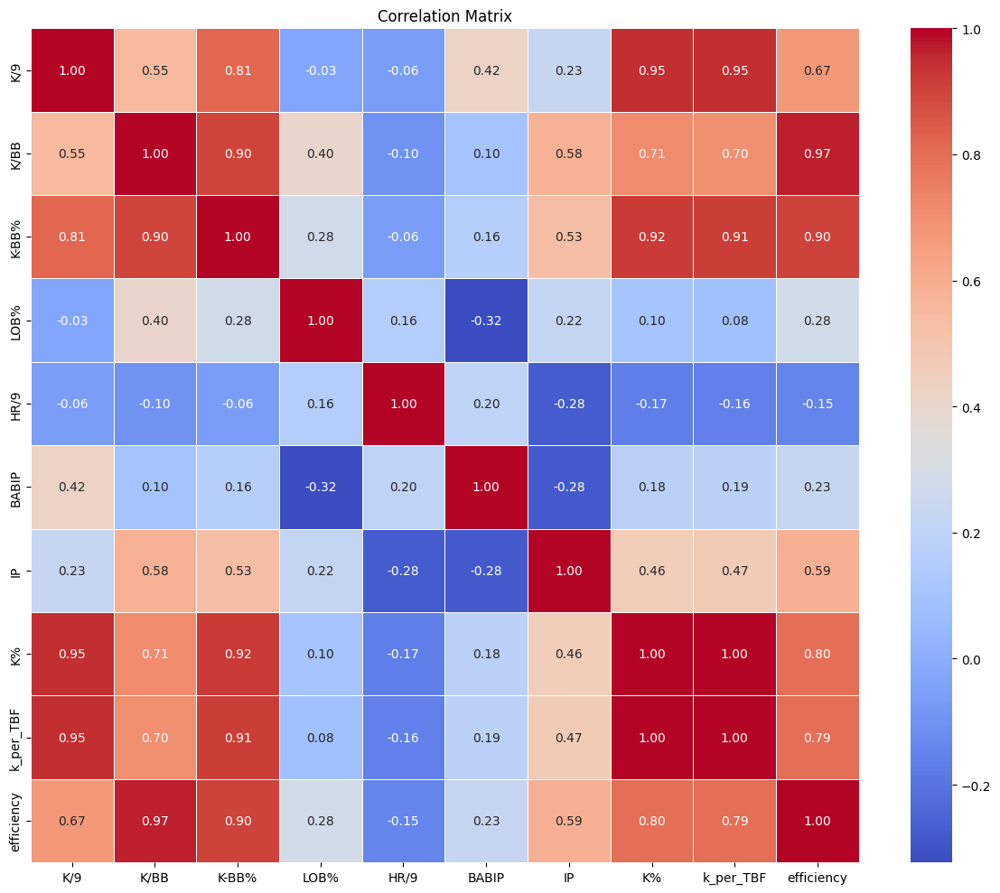


Training set: (10, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0364
Training R²: 1.0000
Test R²: 0.5667
Test MAE: 0.0355


<Figure size 1200x600 with 0 Axes>

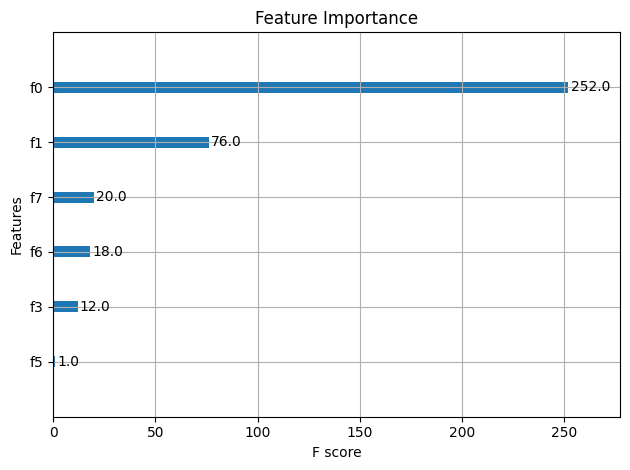


Sample Prediction for Next Game:
Predicted K%: 16.28%
Actual K%: 12.50%
Difference: 3.78%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.125000      0.162787
1   0.210526      0.166740
2   0.076923      0.101887

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs DET.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Casey Mize

Data loaded successfully. Shape: (9, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (9, 15)

Feature correlations with FIP:
FIP              1.000000
xFIP             0.782589
HR_to_K_ratio    0.649012
HR/9             0.558800
WHIP             0.381218
BB/9             0.355003
BB%              0.233270
TBF              0.212554
AVG              0.171330
IP               0.042788
LOB%            -0.060783
K/BB            -0.395509
BABIP           -0.461611
Efficiency      -0.612320
K-BB%           -0.765735
K/9             -0.916041
K%              -0.931844
K_per_TBF       -0.948858
Name: FIP, dtype: float64


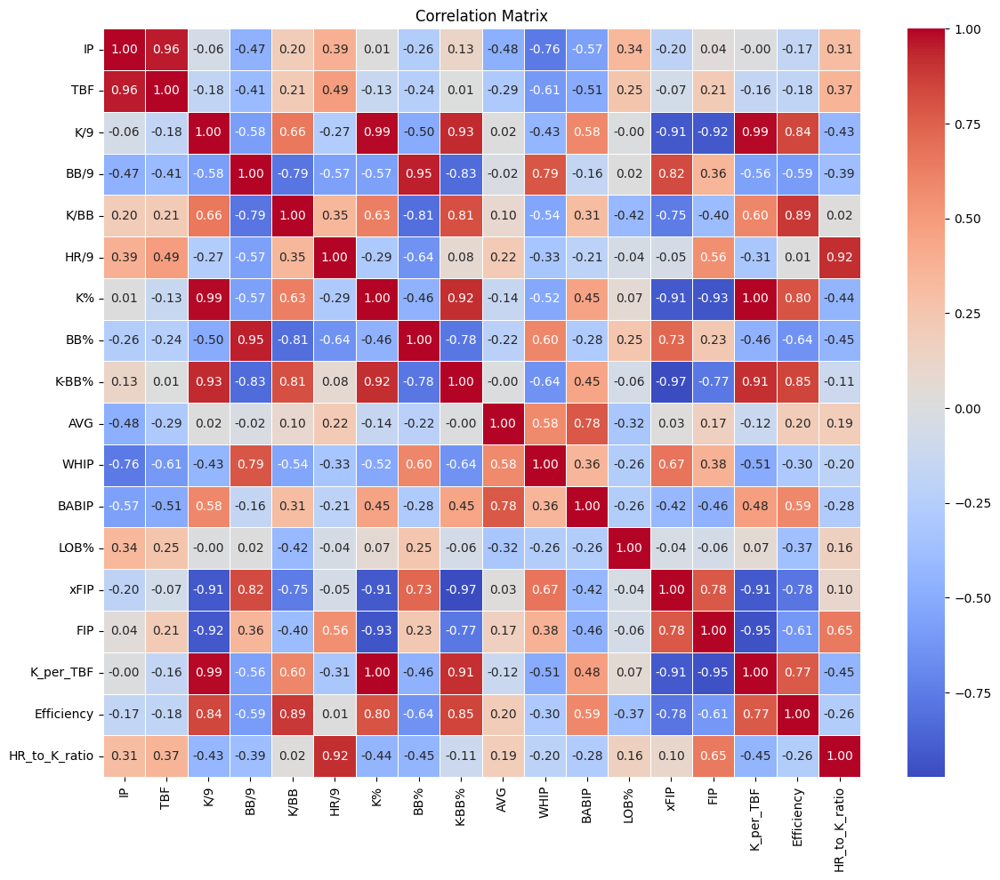


Training set: (7, 17), Test set: (2, 17)

Model Performance:
Training RMSE: 0.0142
Test RMSE: 1.6677
Training R²: 1.0000
Test R²: 0.6073
Test MAE: 1.6337


<Figure size 1200x600 with 0 Axes>

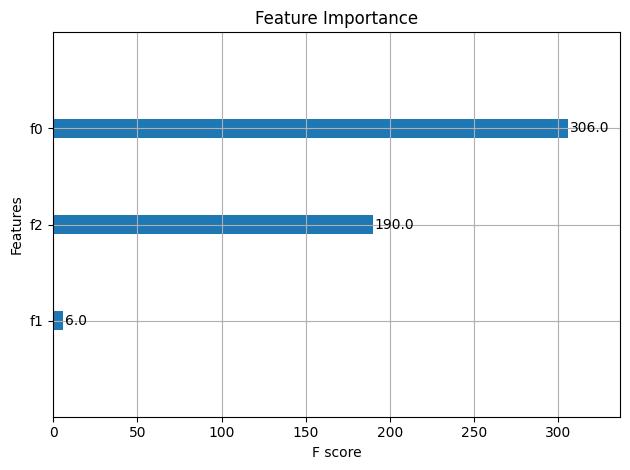


Sample Prediction for Next Game:
Predicted FIP: 4.50
Actual FIP: 2.53
Difference: 1.97

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    2.531383       4.500266
1    7.853980       6.555562

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -4.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (9, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (9, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.996387
K/9           0.986772
K-BB%         0.917333
efficiency    0.795875
K/BB          0.627176
BABIP         0.454412
LOB%          0.073850
IP            0.014277
HR/9         -0.291887
Name: K%, dtype: float64


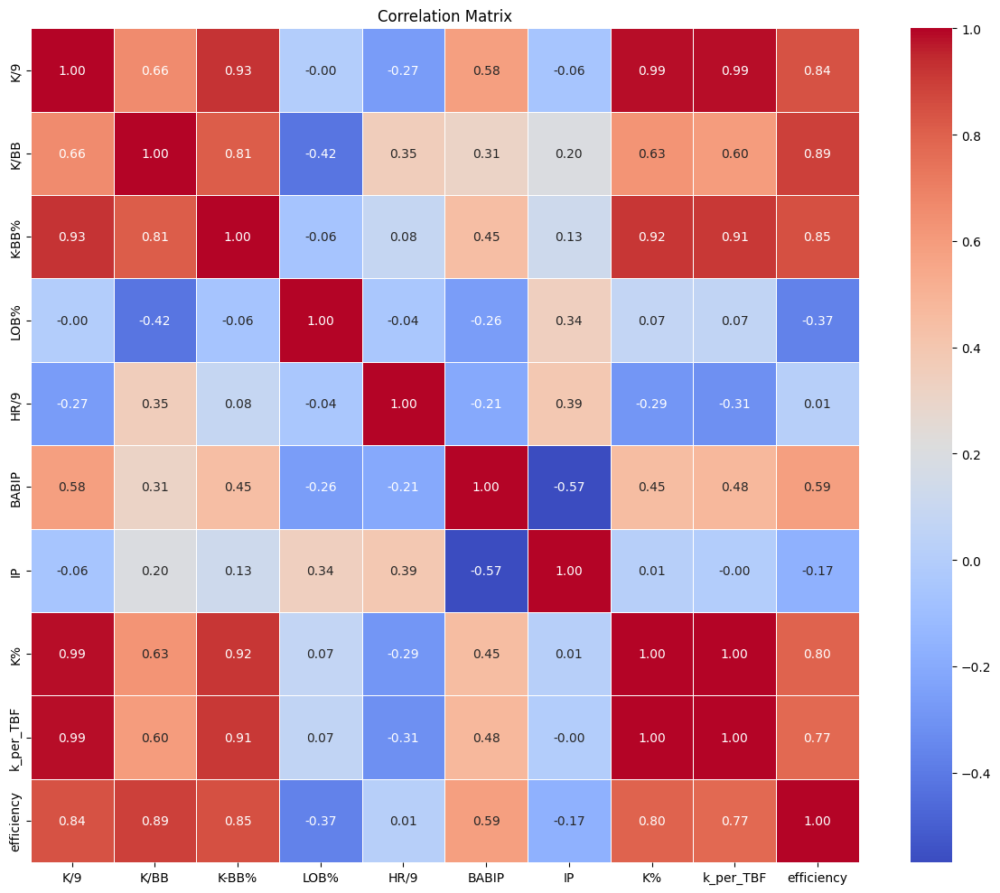


Training set: (7, 9), Test set: (2, 9)

Model Performance:
Training RMSE: 0.0008
Test RMSE: 0.0986
Training R²: 1.0000
Test R²: -0.5357
Test MAE: 0.0982


<Figure size 1200x600 with 0 Axes>

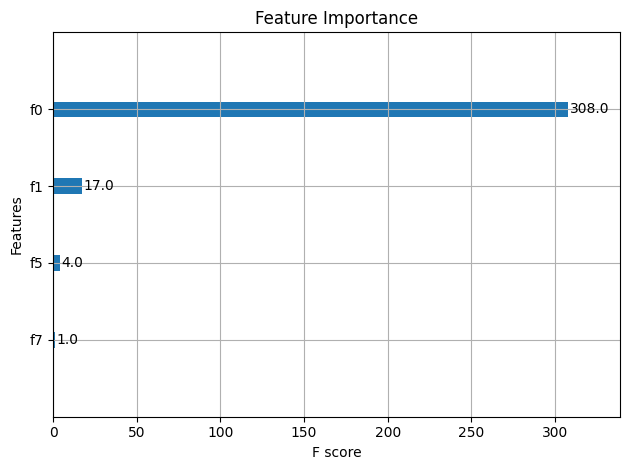


Sample Prediction for Next Game:
Predicted K%: 14.30%
Actual K%: 25.00%
Difference: 10.70%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.250000      0.143003
1   0.090909      0.001549

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -4.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (14, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (14, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.994957
K/9           0.960091
efficiency    0.866176
K-BB%         0.856181
K/BB          0.513490
LOB%          0.412170
HR/9          0.357475
IP           -0.233270
BABIP        -0.465949
Name: K%, dtype: float64


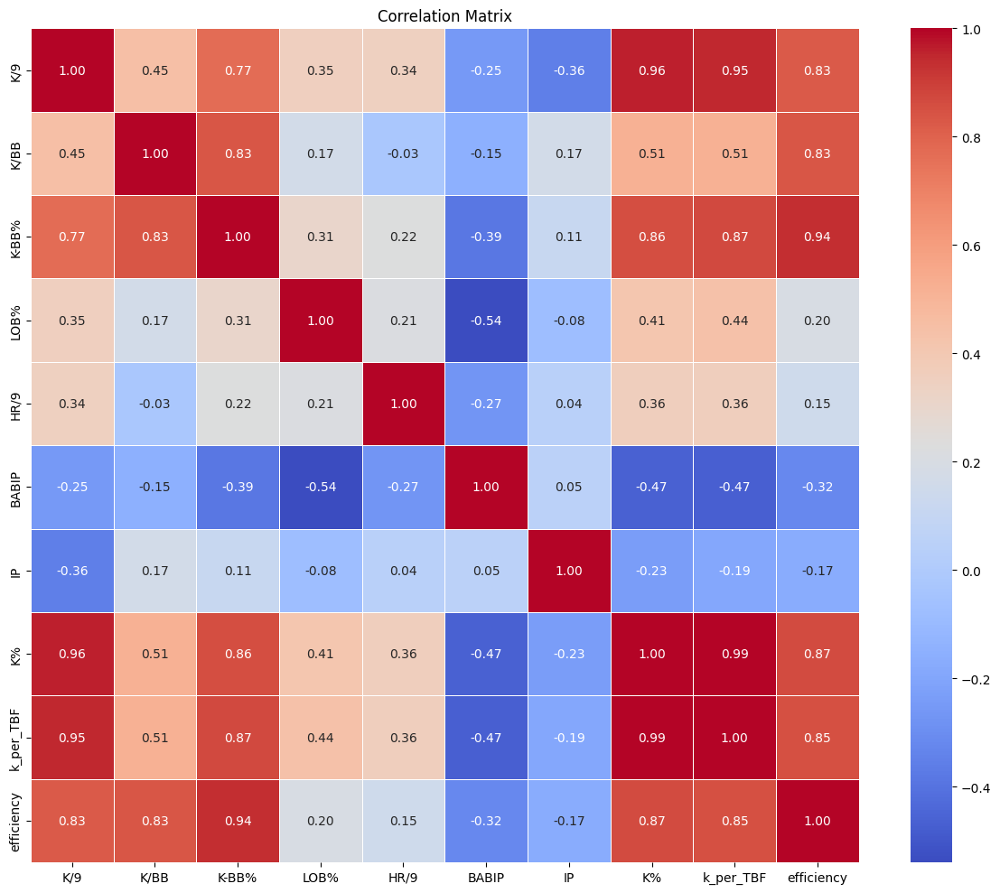


Training set: (11, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0007
Test RMSE: 0.0500
Training R²: 0.9999
Test R²: 0.2028
Test MAE: 0.0399


<Figure size 1200x600 with 0 Axes>

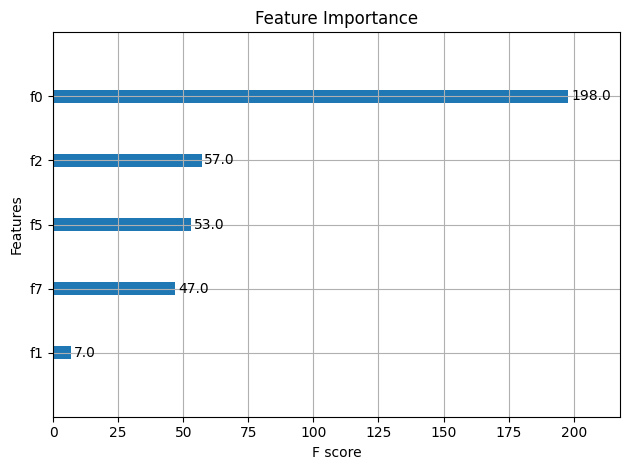


Sample Prediction for Next Game:
Predicted K%: 18.96%
Actual K%: 22.22%
Difference: 3.26%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.222222      0.189584
1   0.086957      0.166805
2   0.173913      0.166805

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs KC.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Ben Brown

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.988179
K/9           0.799656
K-BB%         0.746135
efficiency    0.696801
LOB%          0.542293
K/BB          0.420052
IP            0.299246
BABIP        -0.418800
HR/9         -0.510863
Name: K%, dtype: float64


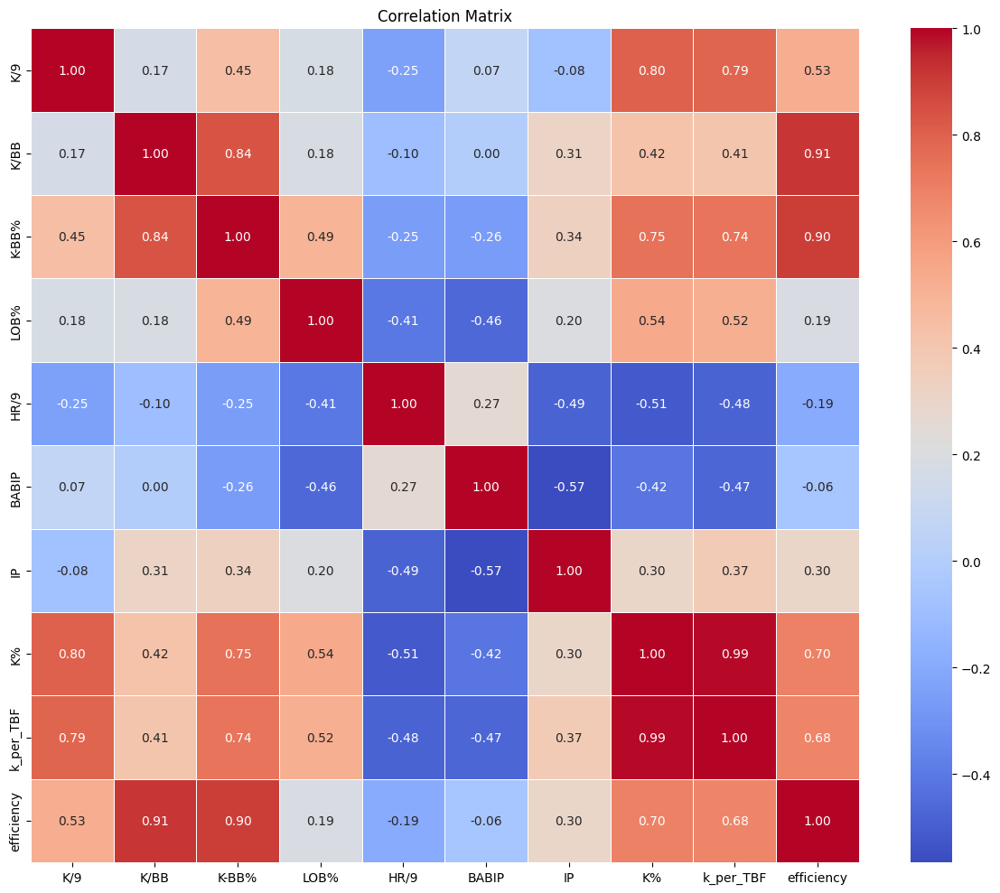


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.1119
Training R²: 0.9999
Test R²: -0.4631
Test MAE: 0.1036


<Figure size 1200x600 with 0 Axes>

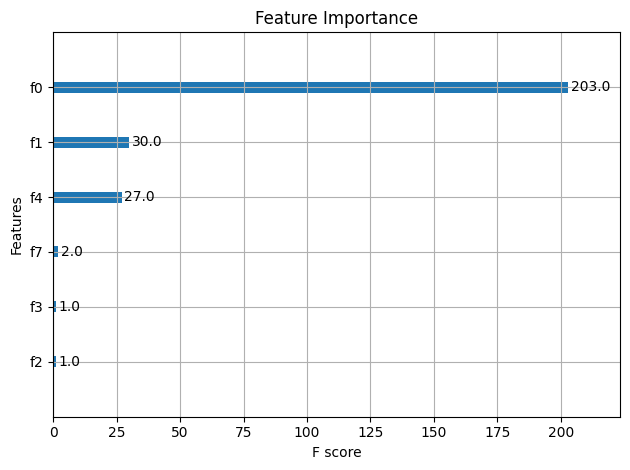


Sample Prediction for Next Game:
Predicted K%: 27.26%
Actual K%: 43.48%
Difference: 16.22%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.434783      0.272585
1   0.312500      0.227551
2   0.208333      0.272129

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP-3.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (12, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (12, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.995594
K/9           0.968350
efficiency    0.833564
K-BB%         0.745577
K/BB          0.603840
BABIP         0.548362
HR/9          0.374643
LOB%         -0.309455
IP           -0.438683
Name: K%, dtype: float64


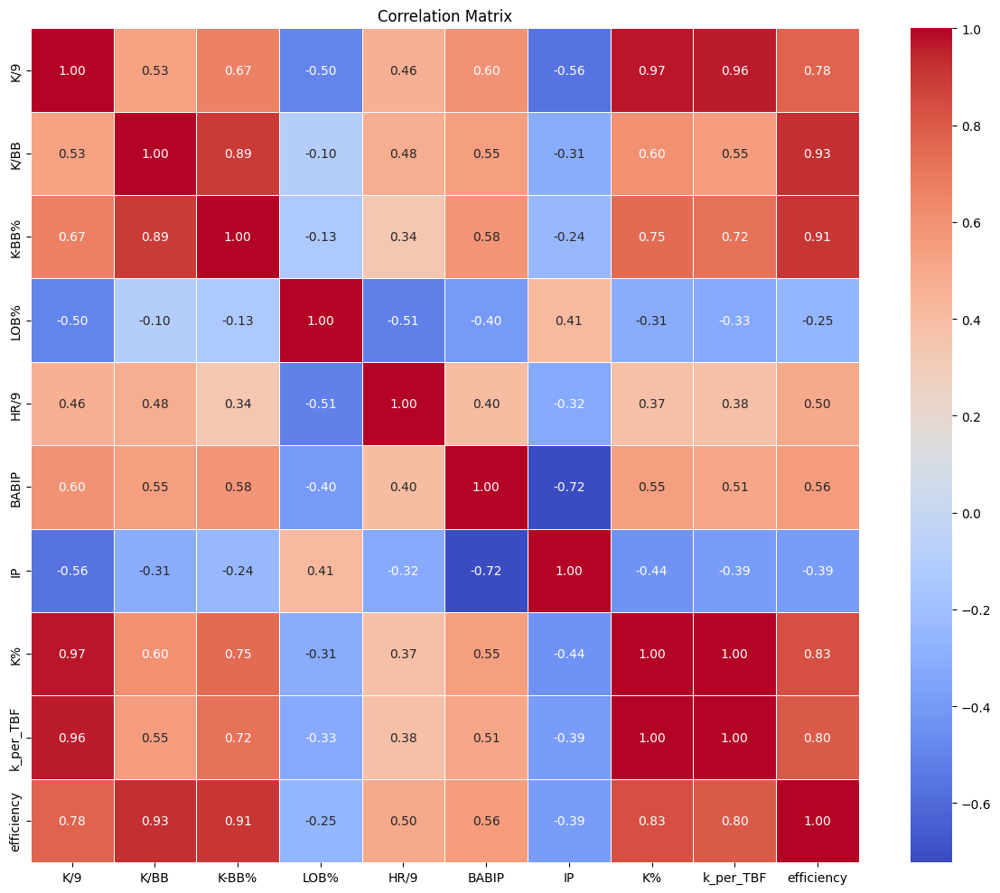


Training set: (9, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0451
Training R²: 0.9999
Test R²: 0.8214
Test MAE: 0.0343


<Figure size 1200x600 with 0 Axes>

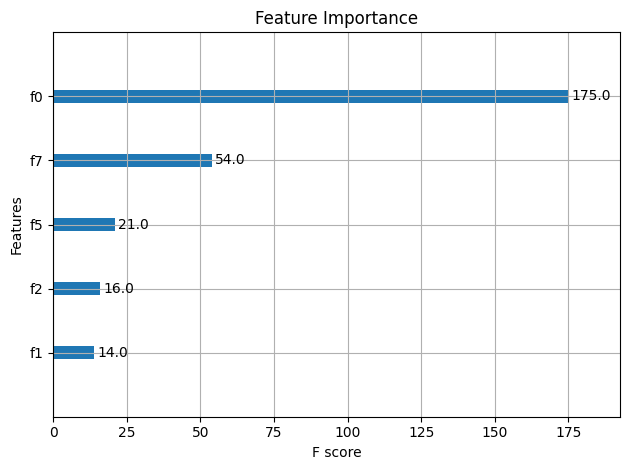


Sample Prediction for Next Game:
Predicted K%: 26.11%
Actual K%: 28.57%
Difference: 2.46%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.285714      0.261113
1   0.333333      0.259320
2   0.086957      0.091141

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs ARZ.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (11, 15)

Feature correlations with FIP:
FIP              1.000000
HR/9             0.897677
HR_to_K_ratio    0.859820
WHIP             0.636125
xFIP             0.618031
AVG              0.526672
BB/9             0.316700
BABIP            0.301789
BB%              0.165640
TBF              0.041006
K/9             -0.273712
K/BB            -0.442292
Efficiency      -0.494708
IP              -0.515793
LOB%            -0.536827
K_per_TBF       -0.605746
K-BB%           -0.618928
K%              -0.637903
Name: FIP, dtype: float64


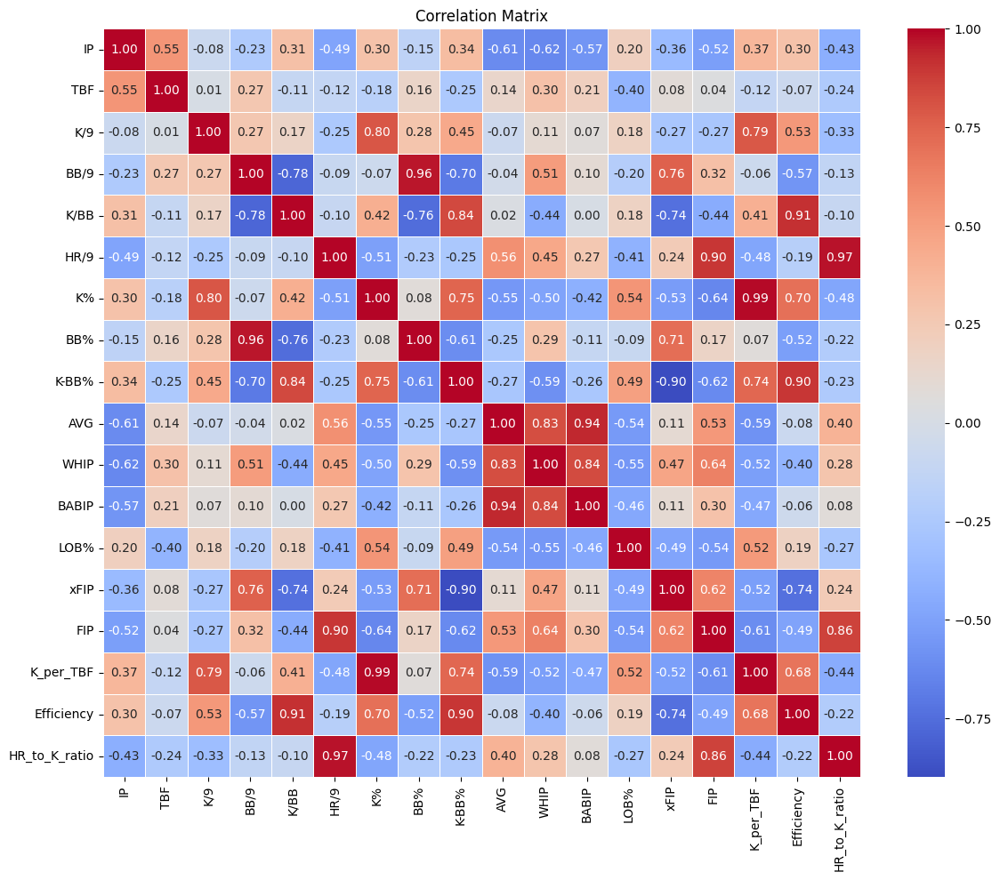


Training set: (8, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0114
Test RMSE: 1.7321
Training R²: 1.0000
Test R²: 0.6407
Test MAE: 1.1235


<Figure size 1200x600 with 0 Axes>

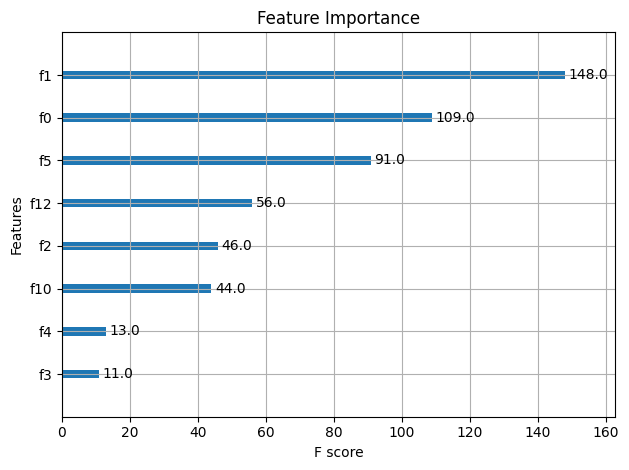


Sample Prediction for Next Game:
Predicted FIP: 1.38
Actual FIP: 1.17
Difference: 0.21

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    1.166480       1.378759
1    1.666480       1.496043
2    7.531383       4.543650

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP-3.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Zac Gallen

Data loaded successfully. Shape: (11, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (11, 15)

Feature correlations with FIP:
FIP              1.000000
HR_to_K_ratio    0.913563
HR/9             0.888255
WHIP             0.865481
xFIP             0.835557
AVG              0.775502
BB/9             0.412941
BABIP            0.360522
TBF              0.225724
BB%              0.225508
LOB%            -0.355950
K/BB            -0.559013
Efficiency      -0.644416
IP              -0.695576
K-BB%           -0.810173
K/9             -0.846421
K_per_TBF       -0.905196
K%              -0.911699
Name: FIP, dtype: float64


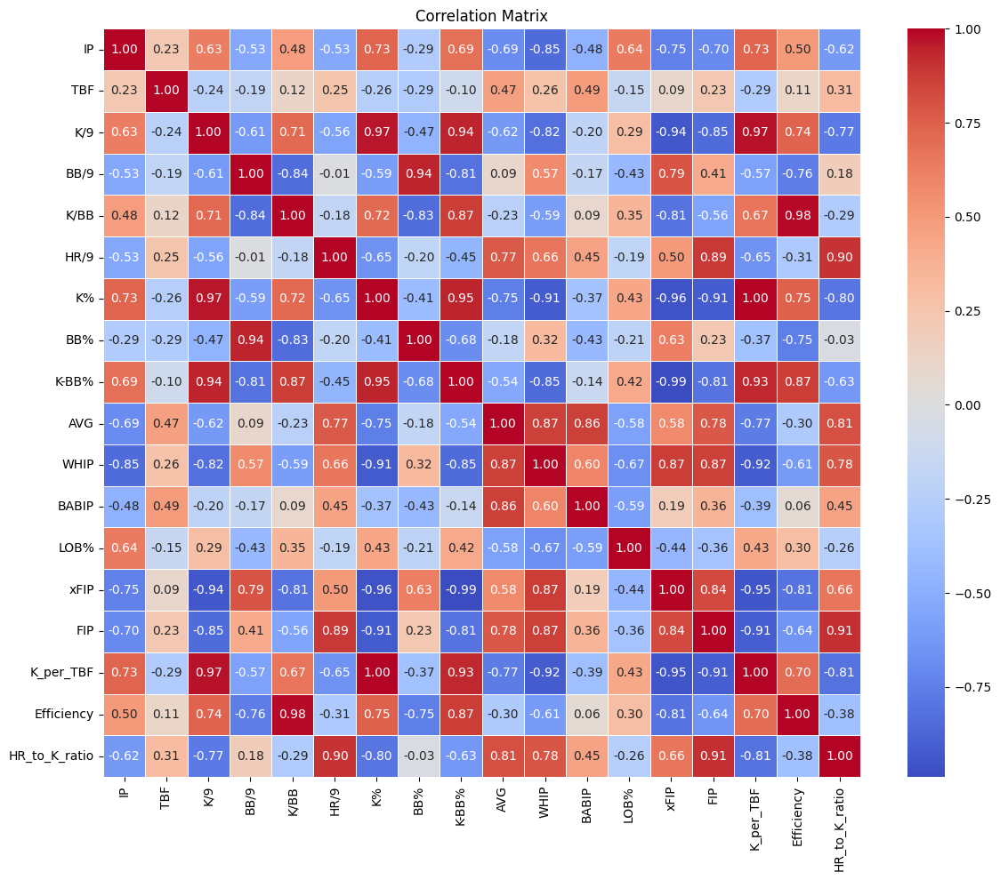


Training set: (8, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0129
Test RMSE: 2.6074
Training R²: 1.0000
Test R²: 0.3022
Test MAE: 2.0211


<Figure size 1200x600 with 0 Axes>

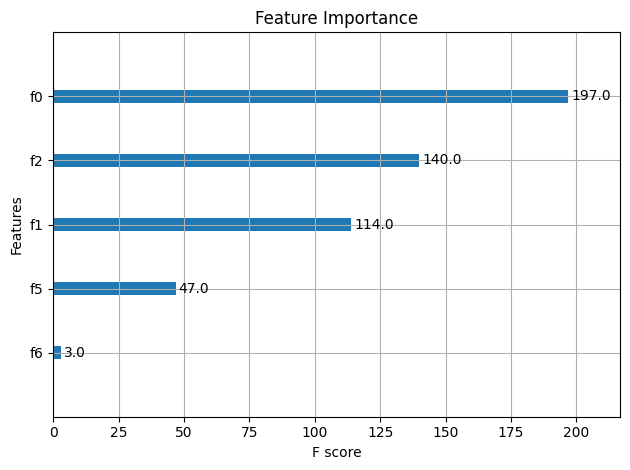


Sample Prediction for Next Game:
Predicted FIP: 5.34
Actual FIP: 9.57
Difference: 4.23

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    9.566480       5.336651
1    2.166480       0.608137
2    7.531383       7.256258

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -5.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.997007
K/9           0.968239
K-BB%         0.945453
efficiency    0.750908
IP            0.729857
K/BB          0.715002
LOB%          0.433645
BABIP        -0.365557
HR/9         -0.653850
Name: K%, dtype: float64


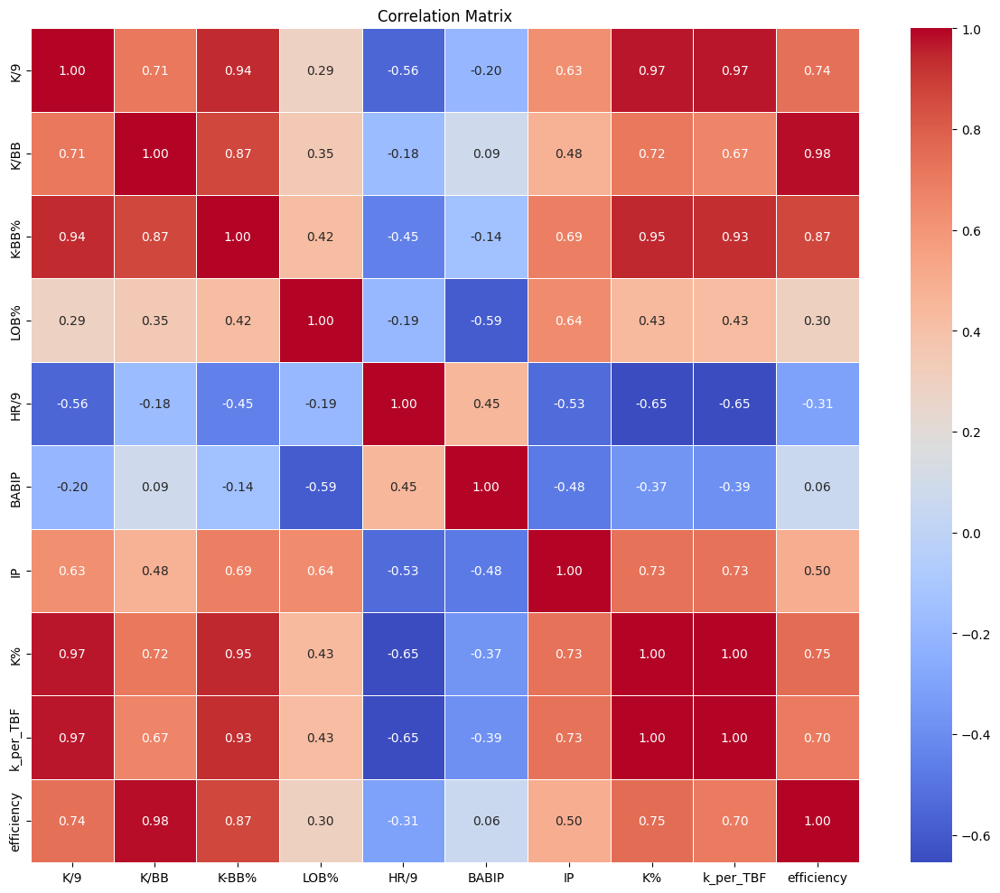


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0647
Training R²: 1.0000
Test R²: 0.7364
Test MAE: 0.0495


<Figure size 1200x600 with 0 Axes>

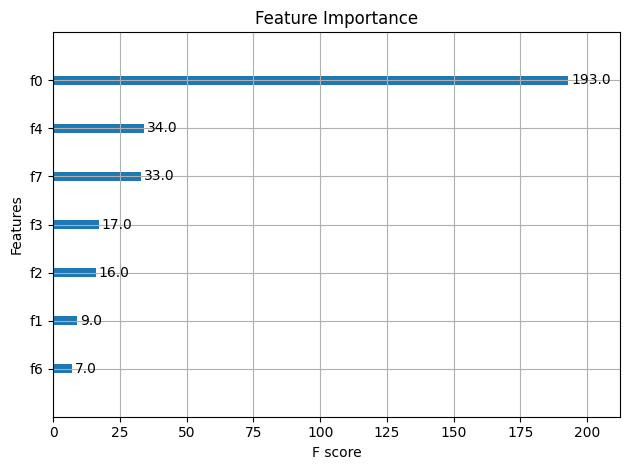


Sample Prediction for Next Game:
Predicted K%: 19.25%
Actual K%: 21.74%
Difference: 2.49%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.217391      0.192538
1   0.391304      0.375922
2   0.083333      0.191565

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -5.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (12, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (12, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.998352
K/9           0.930405
efficiency    0.926358
K/BB          0.918739
K-BB%         0.864554
LOB%          0.578175
IP            0.554462
HR/9         -0.014553
BABIP        -0.397892
Name: K%, dtype: float64


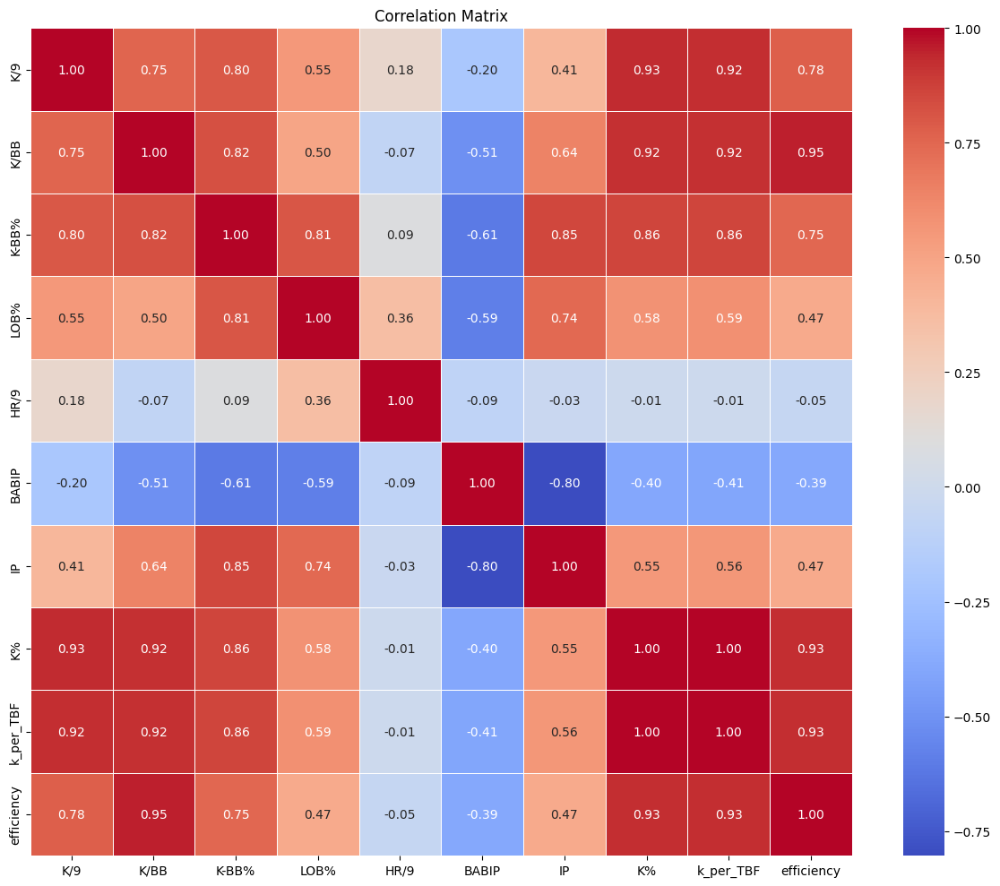


Training set: (9, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0007
Test RMSE: 0.1002
Training R²: 1.0000
Test R²: -0.4387
Test MAE: 0.0989


<Figure size 1200x600 with 0 Axes>

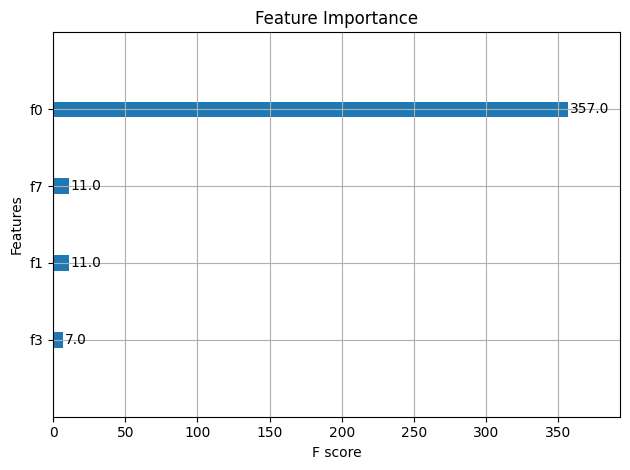


Sample Prediction for Next Game:
Predicted K%: 16.52%
Actual K%: 28.57%
Difference: 12.05%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.285714      0.165193
1   0.083333      0.000614
2   0.210526      0.304034

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs CHC.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Logan Gilbert

Data loaded successfully. Shape: (12, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (12, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.982143
K-BB%         0.930896
efficiency    0.858882
K/9           0.746365
K/BB          0.659368
BABIP         0.287176
IP            0.004204
LOB%         -0.005170
HR/9         -0.713469
Name: K%, dtype: float64


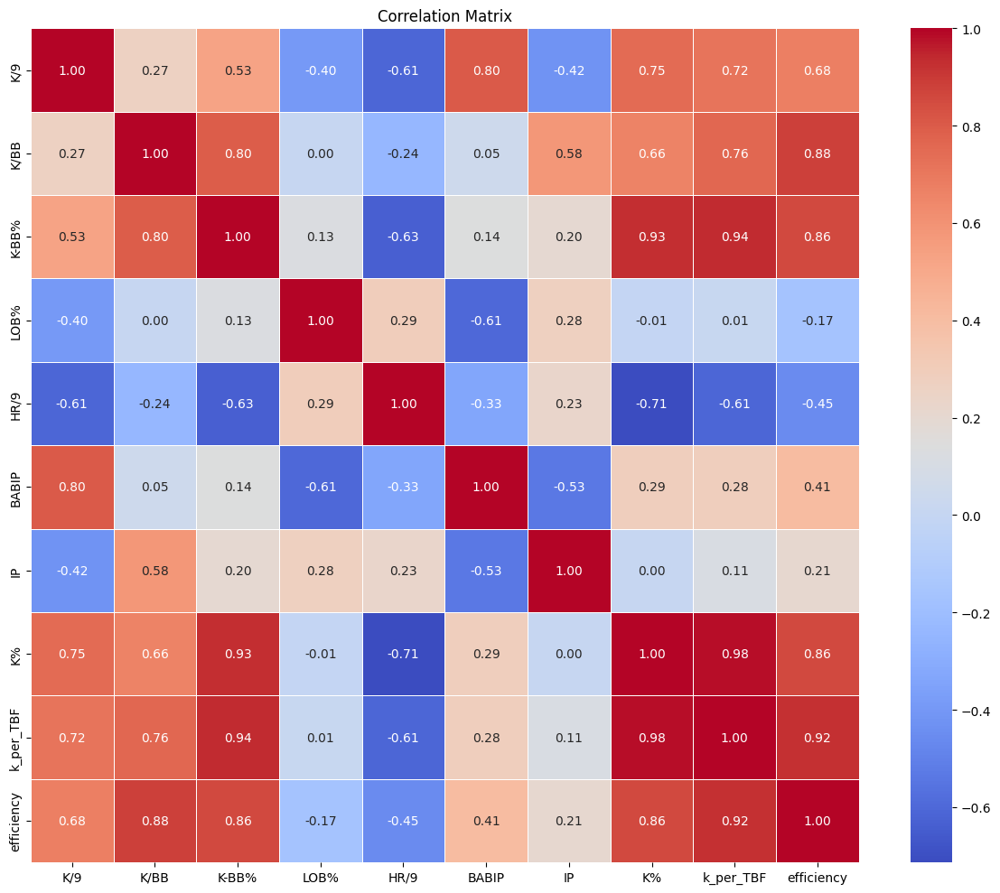


Training set: (9, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0547
Training R²: 0.9999
Test R²: 0.5214
Test MAE: 0.0470


<Figure size 1200x600 with 0 Axes>

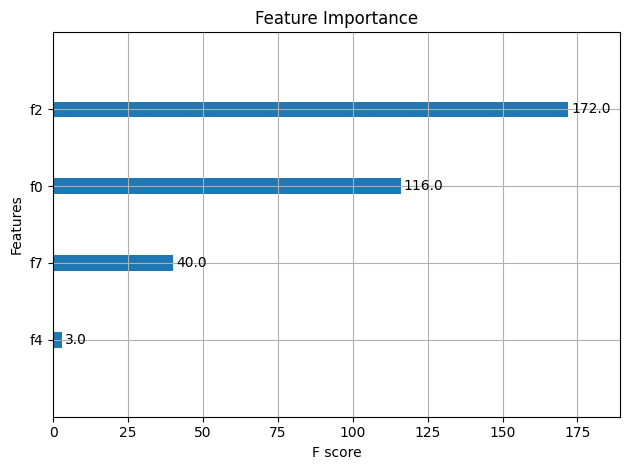


Sample Prediction for Next Game:
Predicted K%: 28.12%
Actual K%: 33.33%
Difference: 5.21%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.333333      0.281191
1   0.476190      0.397853
2   0.291667      0.281191

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -6.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (12, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (12, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.997592
K/9           0.974496
K-BB%         0.840438
efficiency    0.783303
K/BB          0.696429
LOB%          0.112364
IP            0.038965
BABIP         0.010006
HR/9         -0.297806
Name: K%, dtype: float64


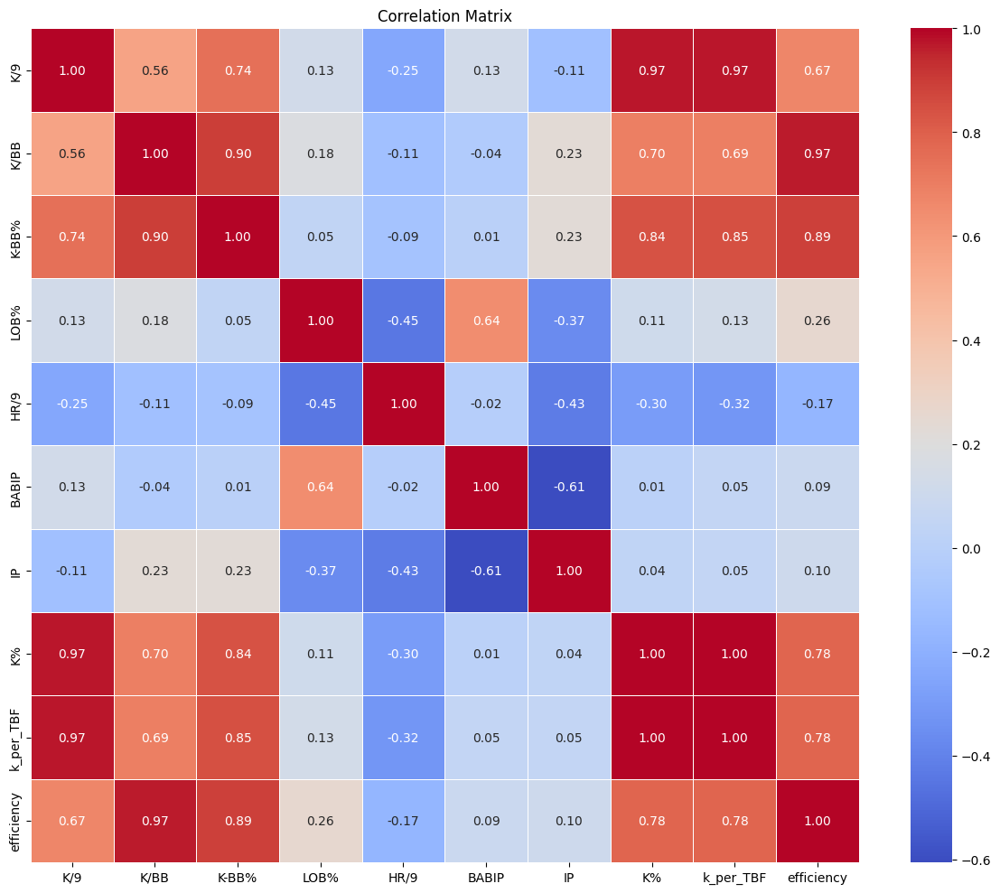


Training set: (9, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0341
Training R²: 0.9999
Test R²: 0.7984
Test MAE: 0.0280


<Figure size 1200x600 with 0 Axes>

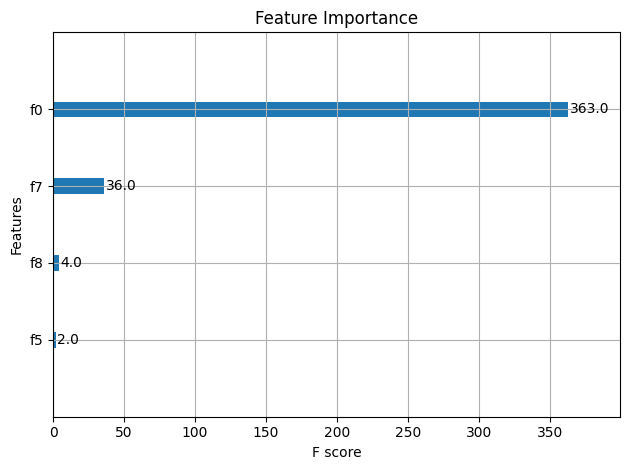


Sample Prediction for Next Game:
Predicted K%: 18.50%
Actual K%: 23.81%
Difference: 5.31%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.238095      0.185032
1   0.130435      0.136009
2   0.315789      0.290377

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs TOR.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (12, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (12, 15)

Feature correlations with FIP:
FIP              1.000000
HR/9             0.975688
HR_to_K_ratio    0.959330
xFIP             0.726208
TBF              0.393839
BB%              0.262578
LOB%             0.247222
IP               0.215298
BB/9             0.191698
WHIP             0.076677
AVG              0.071434
K/BB            -0.374121
BABIP           -0.401330
Efficiency      -0.606038
K/9             -0.701638
K_per_TBF       -0.741885
K-BB%           -0.762004
K%              -0.825723
Name: FIP, dtype: float64


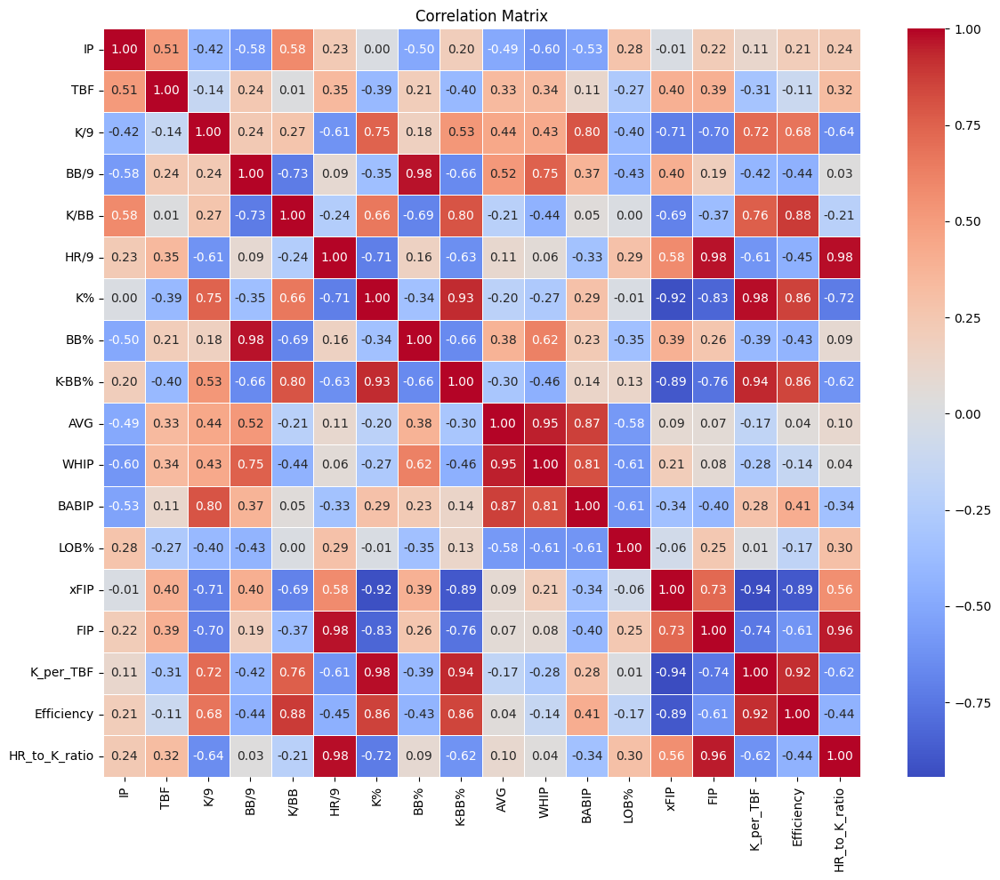


Training set: (9, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0123
Test RMSE: 0.7459
Training R²: 1.0000
Test R²: 0.8193
Test MAE: 0.6164


<Figure size 1200x600 with 0 Axes>

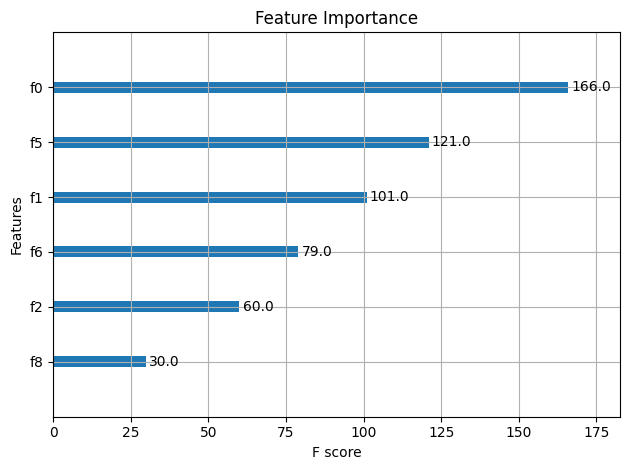


Sample Prediction for Next Game:
Predicted FIP: 2.72
Actual FIP: 3.91
Difference: 1.20

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    3.913736       2.715538
1   -0.368617      -0.146996
2    1.452194       1.022876

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -6.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#José Berríos

Data loaded successfully. Shape: (11, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (11, 15)

Feature correlations with FIP:
FIP              1.000000
HR/9             0.955813
HR_to_K_ratio    0.927727
WHIP             0.761931
AVG              0.732843
xFIP             0.563801
BABIP            0.474404
BB/9             0.438577
BB%              0.281224
K/9              0.202615
K_per_TBF       -0.154884
Efficiency      -0.164806
K%              -0.190175
K/BB            -0.291516
TBF             -0.318531
K-BB%           -0.322598
LOB%            -0.436989
IP              -0.585361
Name: FIP, dtype: float64


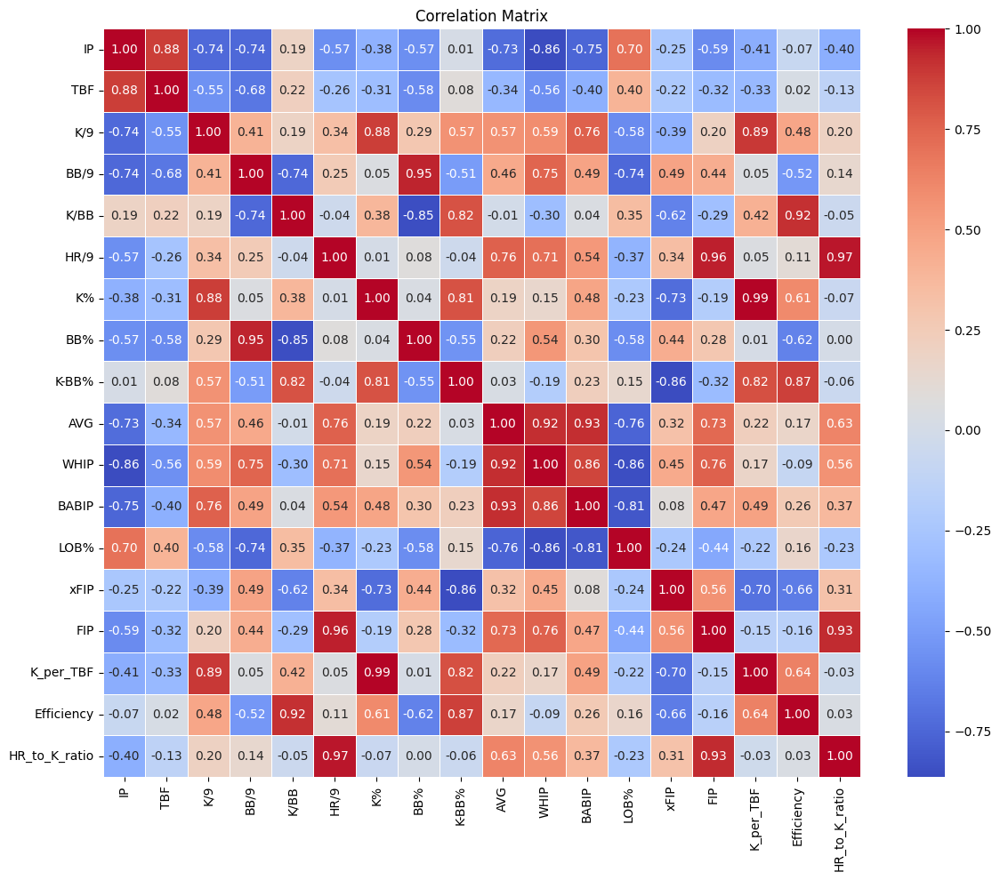


Training set: (8, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0127
Test RMSE: 1.2822
Training R²: 1.0000
Test R²: -1.3683
Test MAE: 1.2448


<Figure size 1200x600 with 0 Axes>

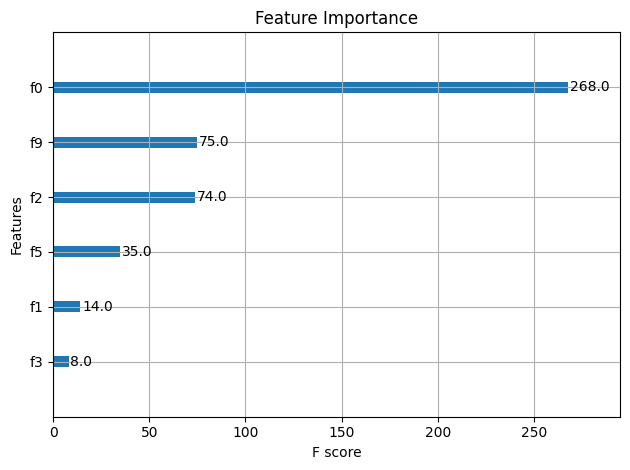


Sample Prediction for Next Game:
Predicted FIP: 2.33
Actual FIP: 3.83
Difference: 1.50

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    3.833146       2.329597
1    2.023623       3.441493
2    3.745668       4.558638

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -7.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.993277
K/9           0.877900
K-BB%         0.813577
efficiency    0.606290
BABIP         0.476666
K/BB          0.382492
HR/9          0.007175
LOB%         -0.225911
IP           -0.383455
Name: K%, dtype: float64


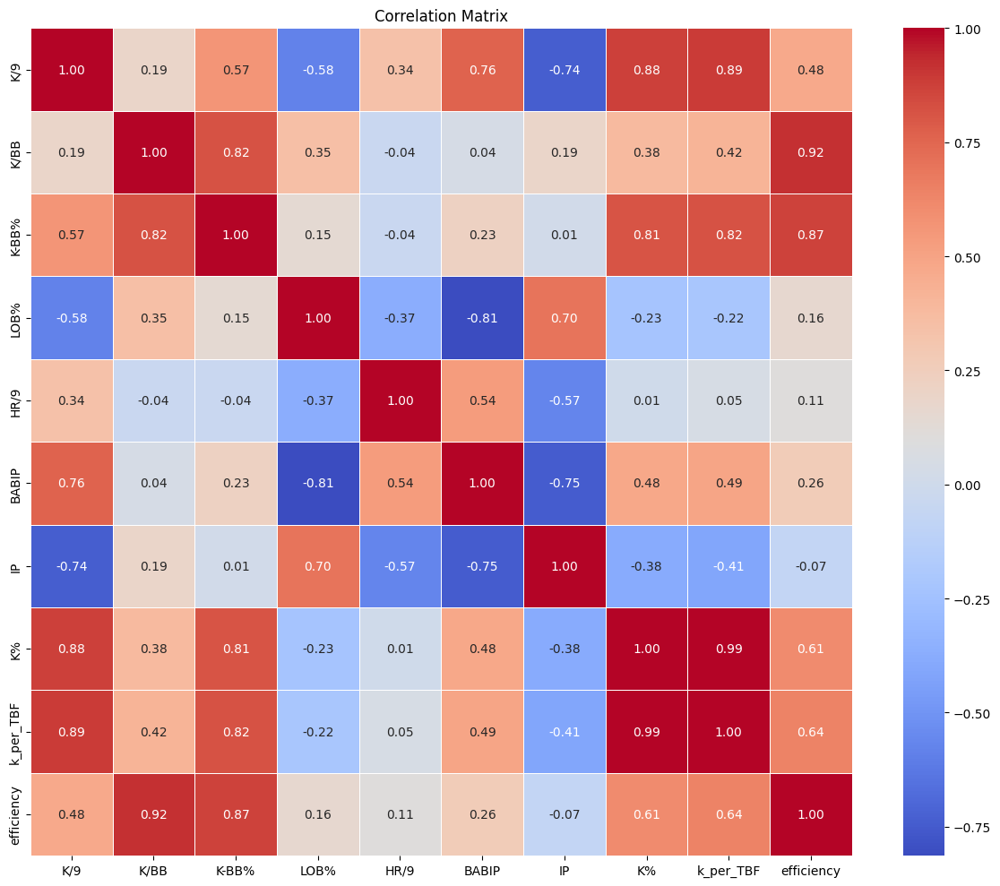


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0528
Training R²: 0.9999
Test R²: 0.5815
Test MAE: 0.0448


<Figure size 1200x600 with 0 Axes>

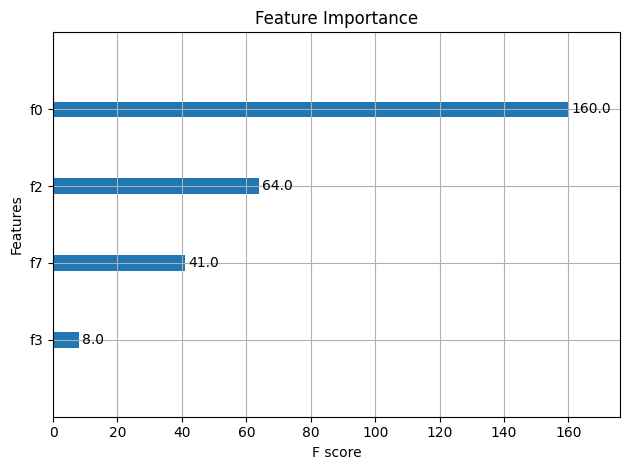


Sample Prediction for Next Game:
Predicted K%: 22.72%
Actual K%: 25.00%
Difference: 2.28%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.250000      0.227172
1   0.250000      0.222763
2   0.076923      0.161155

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -7.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (12, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (12, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.993101
K/9           0.913104
efficiency    0.875596
K-BB%         0.790771
K/BB          0.757409
HR/9          0.144775
LOB%          0.102528
IP            0.078095
BABIP        -0.122927
Name: K%, dtype: float64


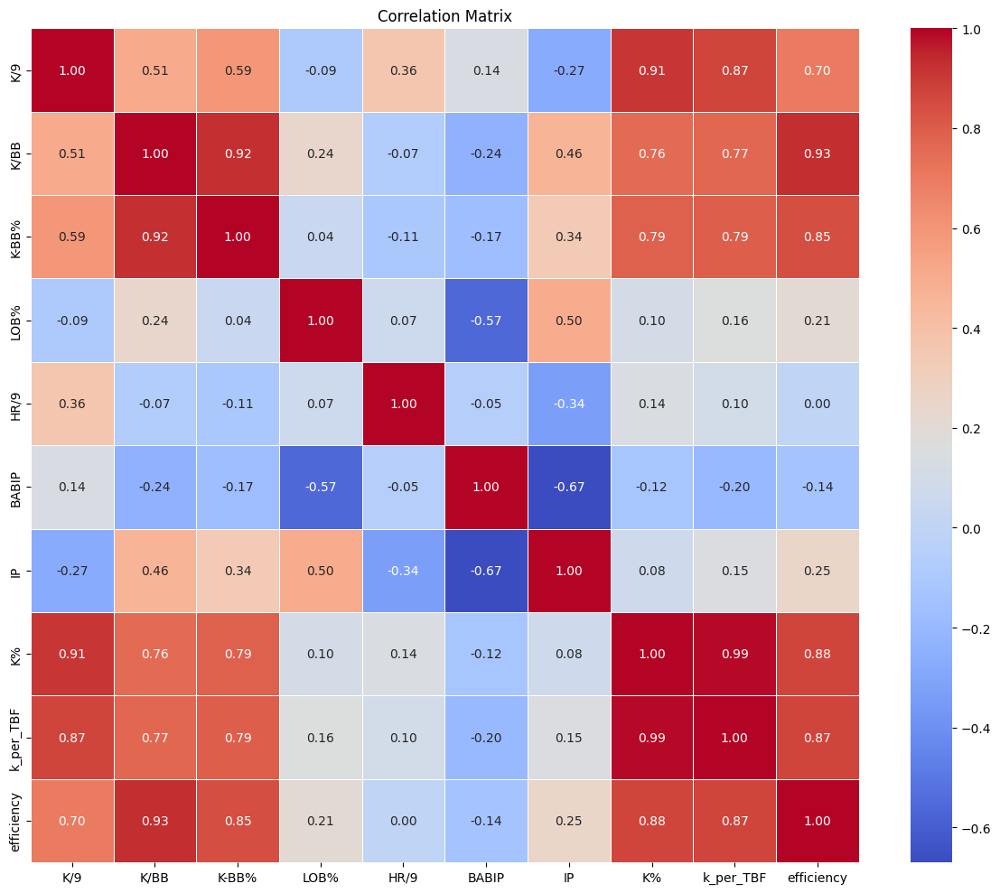


Training set: (9, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0641
Training R²: 0.9999
Test R²: 0.3154
Test MAE: 0.0606


<Figure size 1200x600 with 0 Axes>

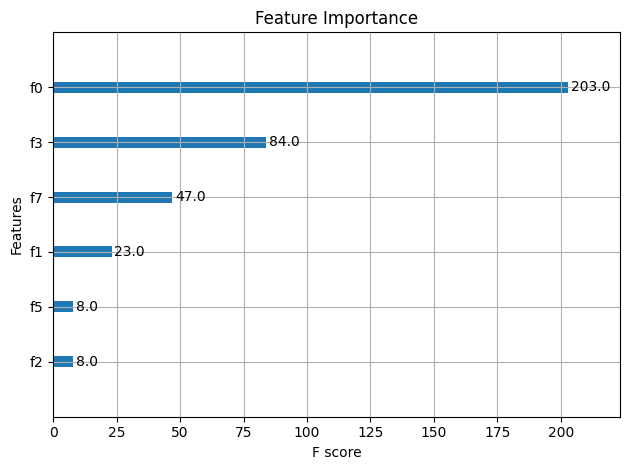


Sample Prediction for Next Game:
Predicted K%: 36.21%
Actual K%: 27.27%
Difference: 8.94%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.272727      0.362136
1   0.166667      0.207121
2   0.083333      0.135366

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs SEA.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Nathan Eovaldi

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.998140
K/9           0.939400
K-BB%         0.926200
efficiency    0.833415
K/BB          0.632575
IP            0.365646
LOB%          0.238501
HR/9         -0.036272
BABIP        -0.600242
Name: K%, dtype: float64


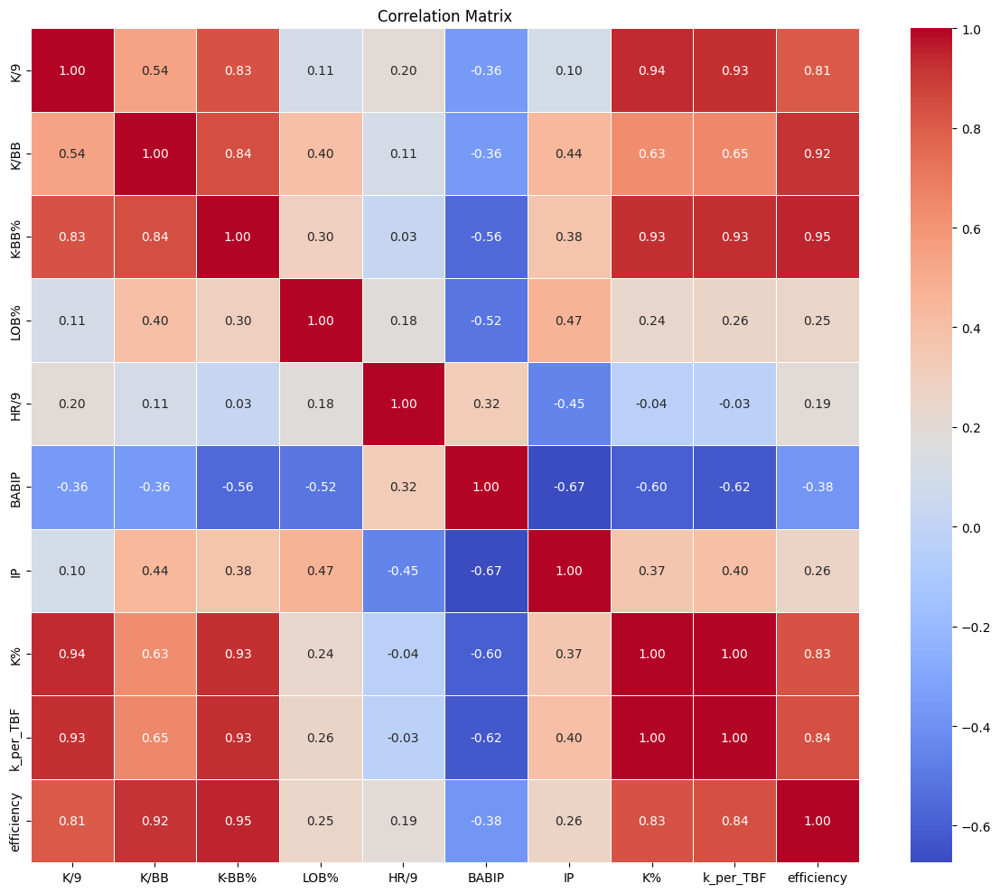


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0272
Training R²: 1.0000
Test R²: 0.1775
Test MAE: 0.0226


<Figure size 1200x600 with 0 Axes>

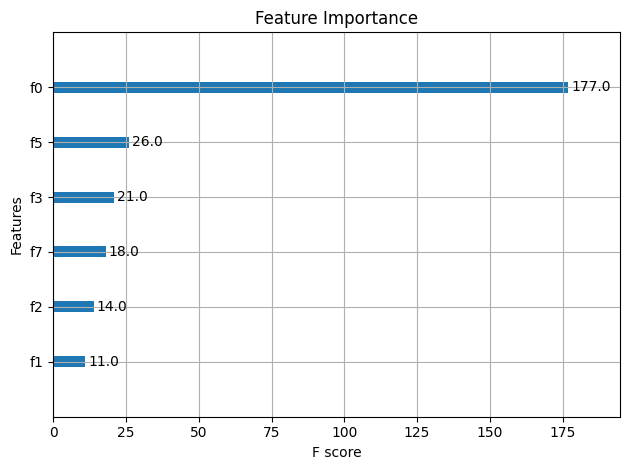


Sample Prediction for Next Game:
Predicted K%: 24.79%
Actual K%: 25.00%
Difference: 0.21%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.250000      0.247858
1   0.192308      0.154356
2   0.181818      0.154027

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -8.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (12, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (12, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.982234
K-BB%         0.863634
efficiency    0.773411
K/9           0.759074
K/BB          0.747094
IP            0.418553
LOB%          0.287550
HR/9         -0.435493
BABIP        -0.461018
Name: K%, dtype: float64


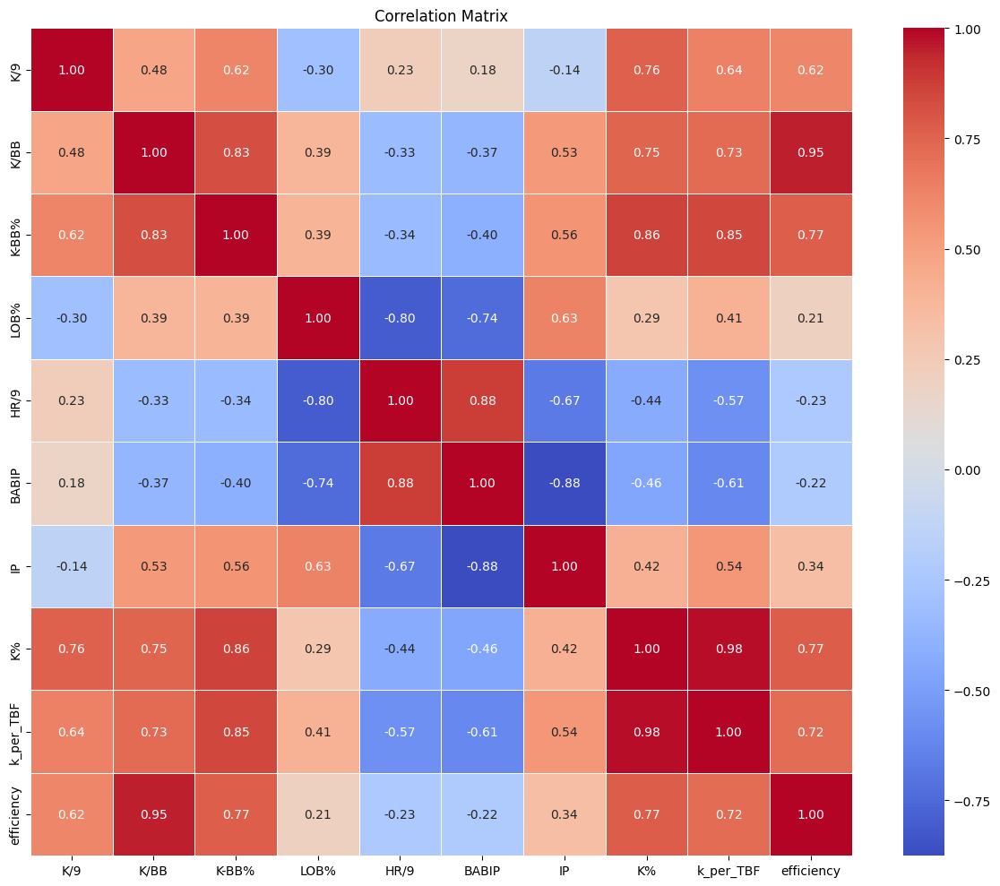


Training set: (9, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0007
Test RMSE: 0.1143
Training R²: 0.9999
Test R²: -38.5535
Test MAE: 0.0789


<Figure size 1200x600 with 0 Axes>

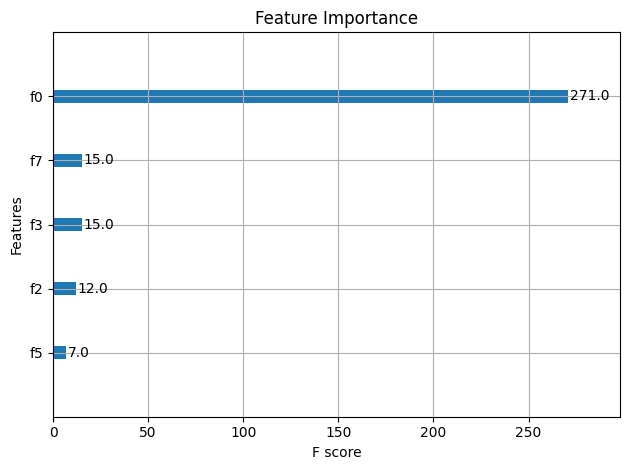


Sample Prediction for Next Game:
Predicted K%: 29.50%
Actual K%: 10.00%
Difference: 19.50%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.100000      0.295016
1   0.055556      0.046979
2   0.080000      0.046979

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs LAD.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (11, 15)

Feature correlations with FIP:
FIP              1.000000
HR_to_K_ratio    0.927944
HR/9             0.898385
AVG              0.647872
WHIP             0.606803
xFIP             0.540831
BABIP            0.478497
BB/9             0.157520
LOB%             0.049841
BB%              0.041997
K/9             -0.155355
Efficiency      -0.232563
K/BB            -0.289405
TBF             -0.296851
K-BB%           -0.381236
K%              -0.406395
K_per_TBF       -0.408495
IP              -0.634486
Name: FIP, dtype: float64


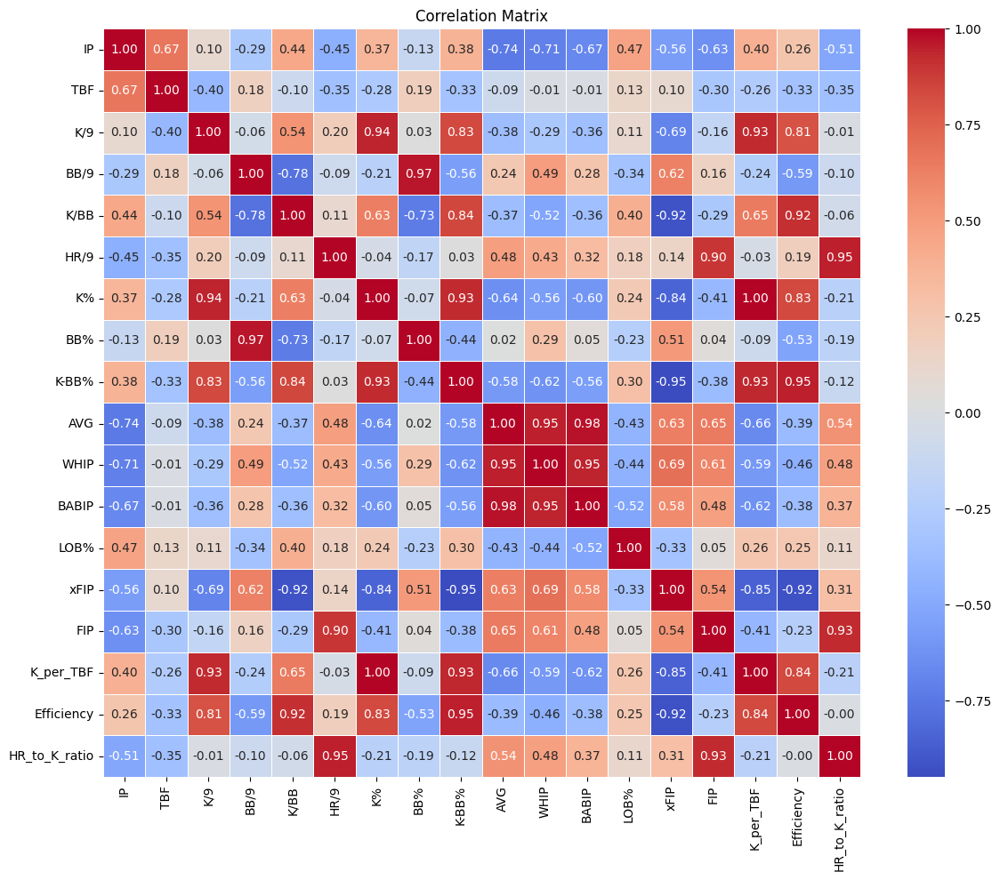


Training set: (8, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0119
Test RMSE: 3.3843
Training R²: 1.0000
Test R²: -16.6658
Test MAE: 3.0299


<Figure size 1200x600 with 0 Axes>

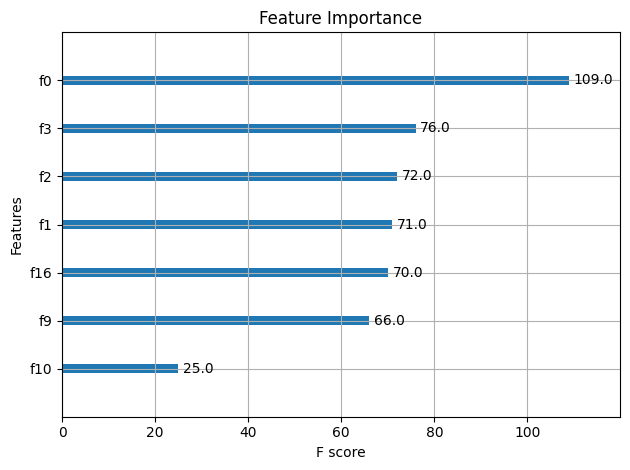


Sample Prediction for Next Game:
Predicted FIP: 7.57
Actual FIP: 2.45
Difference: 5.12

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    2.452194       7.574965
1    1.999813       4.335637
2    3.888526       5.519699

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -8.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Hunter Greene

Data loaded successfully. Shape: (11, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (11, 15)

Feature correlations with FIP:
FIP              1.000000
WHIP             0.727022
HR_to_K_ratio    0.684984
HR/9             0.675022
xFIP             0.629883
BB/9             0.518719
AVG              0.504105
BB%              0.483672
BABIP            0.158203
LOB%             0.045200
K/9             -0.248036
K_per_TBF       -0.381840
K%              -0.392411
K-BB%           -0.492443
TBF             -0.545087
Efficiency      -0.585870
K/BB            -0.690617
IP              -0.703081
Name: FIP, dtype: float64


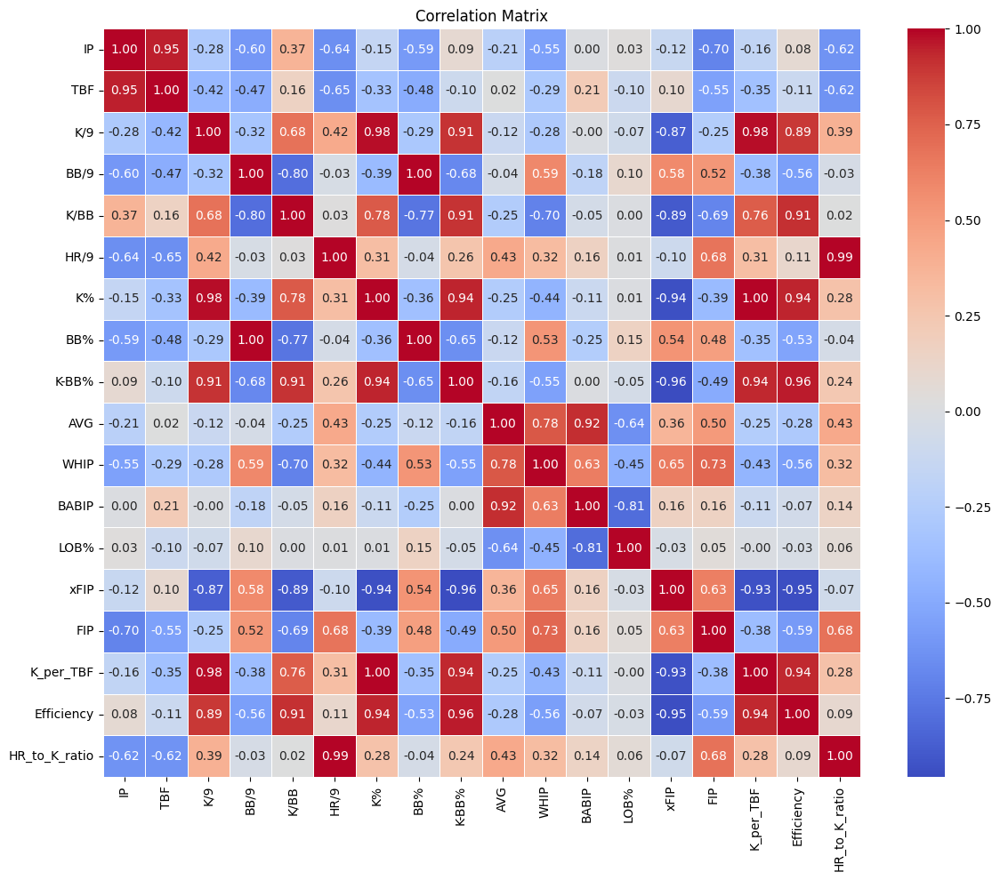


Training set: (8, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0054
Test RMSE: 1.6512
Training R²: 1.0000
Test R²: 0.0754
Test MAE: 1.4424


<Figure size 1200x600 with 0 Axes>

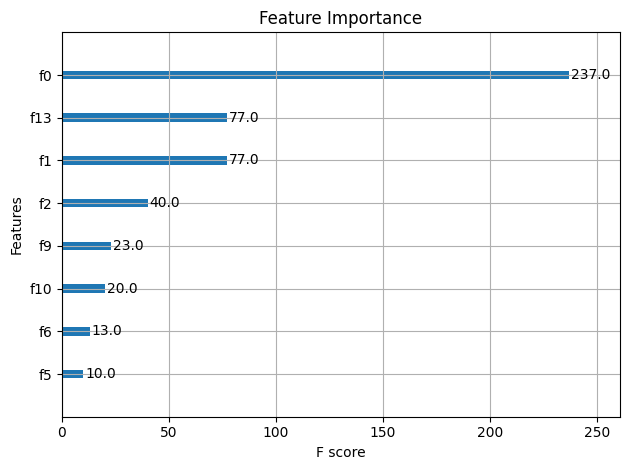


Sample Prediction for Next Game:
Predicted FIP: 3.33
Actual FIP: 5.83
Difference: 2.50

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    5.833146       3.328152
1    2.880765       3.442358
2    1.762152       3.022819

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -9.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.999441
K/9           0.983099
K-BB%         0.942741
efficiency    0.942534
K/BB          0.775151
HR/9          0.307327
LOB%          0.005766
BABIP        -0.108439
IP           -0.150655
Name: K%, dtype: float64


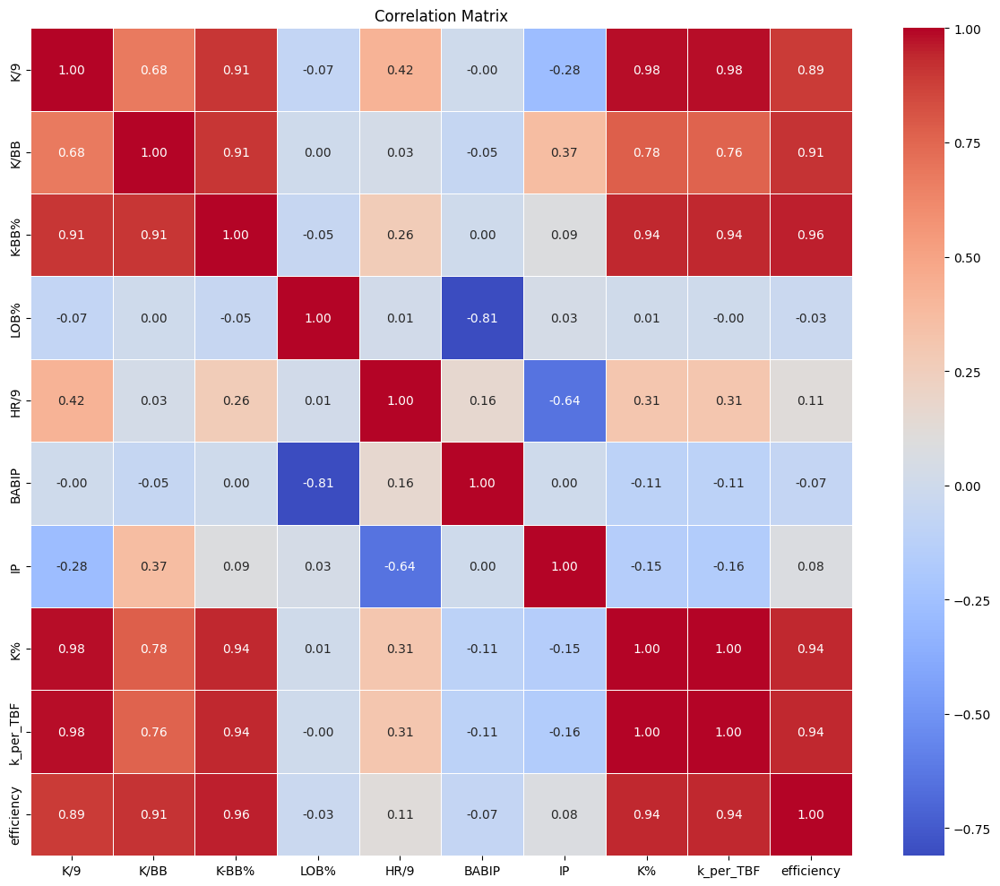


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0000
Test RMSE: 0.0409
Training R²: 1.0000
Test R²: 0.1699
Test MAE: 0.0325


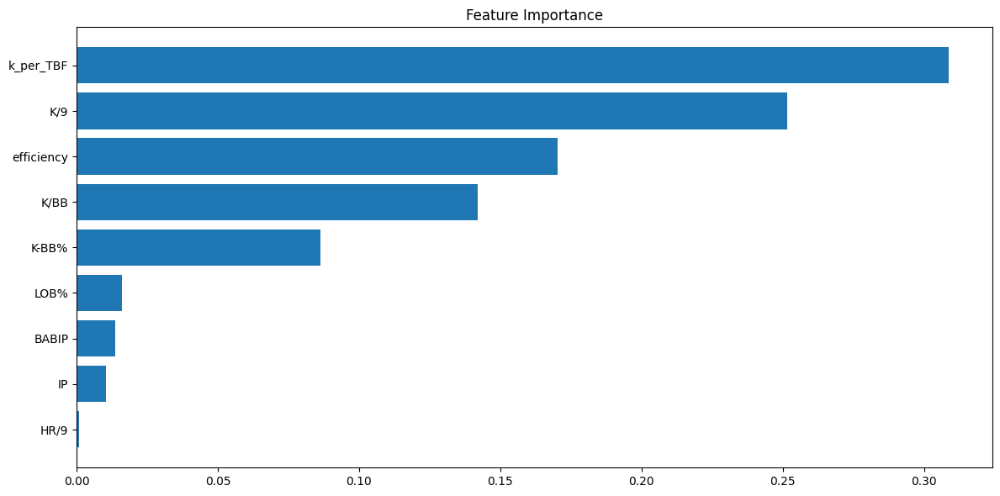


Sample Prediction for Next Game:
Predicted K%: 27.03%
Actual K%: 33.33%
Difference: 6.31%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.333333      0.270269
1   0.259259      0.226921
2   0.225806      0.227792

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import GradientBoostingRegressor
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -9.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train Gradient Boosting Model ==========
# Initialize Gradient Boosting model
gb_model = GradientBoostingRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42,
    subsample=0.8,
    loss='squared_error'
)

# Train the model
gb_model.fit(X_train_scaled, y_train)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=GradientBoostingRegressor(random_state=42, loss='squared_error'),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = gb_model.predict(X_train_scaled)
y_pred_test = gb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
feature_importance = gb_model.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), np.array(X_train.columns)[sorted_idx])
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained Gradient Boosting model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, gb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
import joblib
joblib.dump(gb_model, 'mlb_pitcher_k_percent_gb_model.pkl')
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained Gradient Boosting model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, gb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.999441
K/9           0.983099
K-BB%         0.942741
efficiency    0.942534
K/BB          0.775151
HR/9          0.307327
LOB%          0.005766
BABIP        -0.108439
IP           -0.150655
Name: K%, dtype: float64


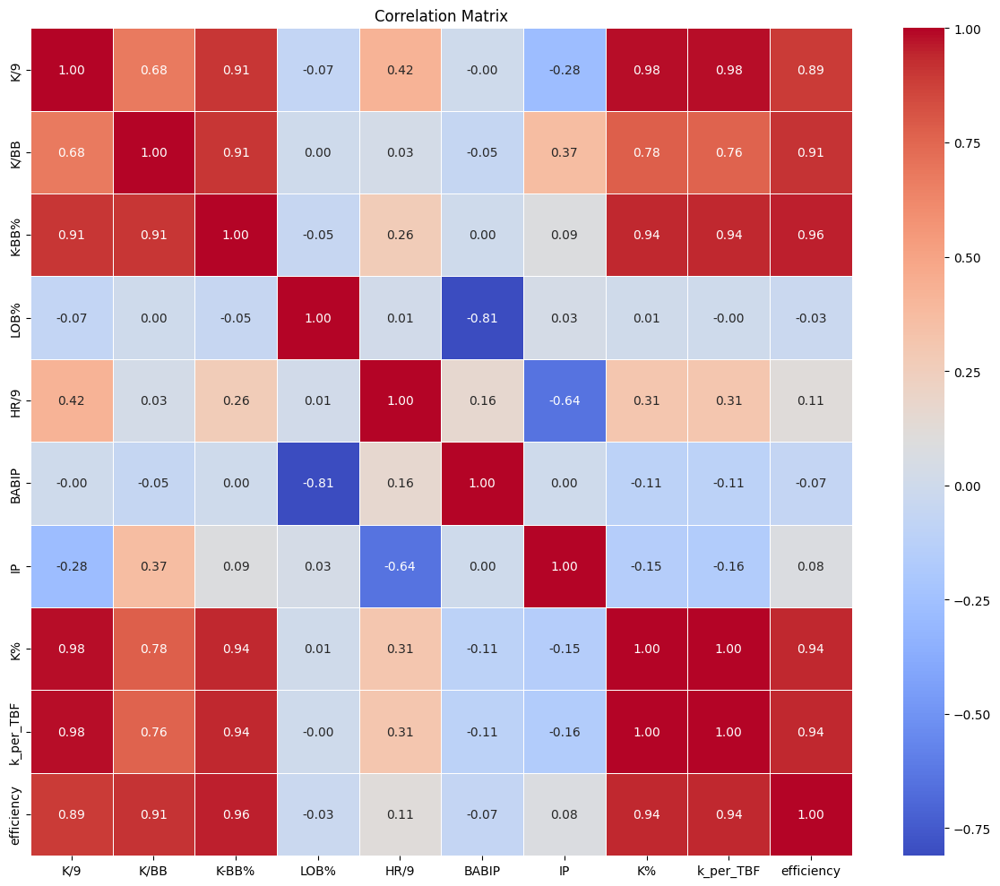


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0007
Test RMSE: 0.0491
Training R²: 1.0000
Test R²: -0.1943
Test MAE: 0.0452


<Figure size 1200x600 with 0 Axes>

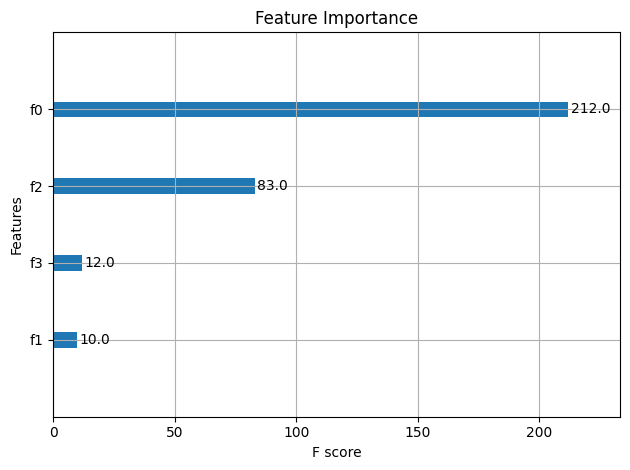


Sample Prediction for Next Game:
Predicted K%: 30.60%
Actual K%: 33.33%
Difference: 2.73%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.333333      0.306048
1   0.259259      0.187556
2   0.225806      0.189109

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -9.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.996818
K/9           0.981889
K-BB%         0.967975
efficiency    0.953305
K/BB          0.920164
LOB%          0.382016
IP            0.341170
HR/9         -0.071061
BABIP        -0.276723
Name: K%, dtype: float64


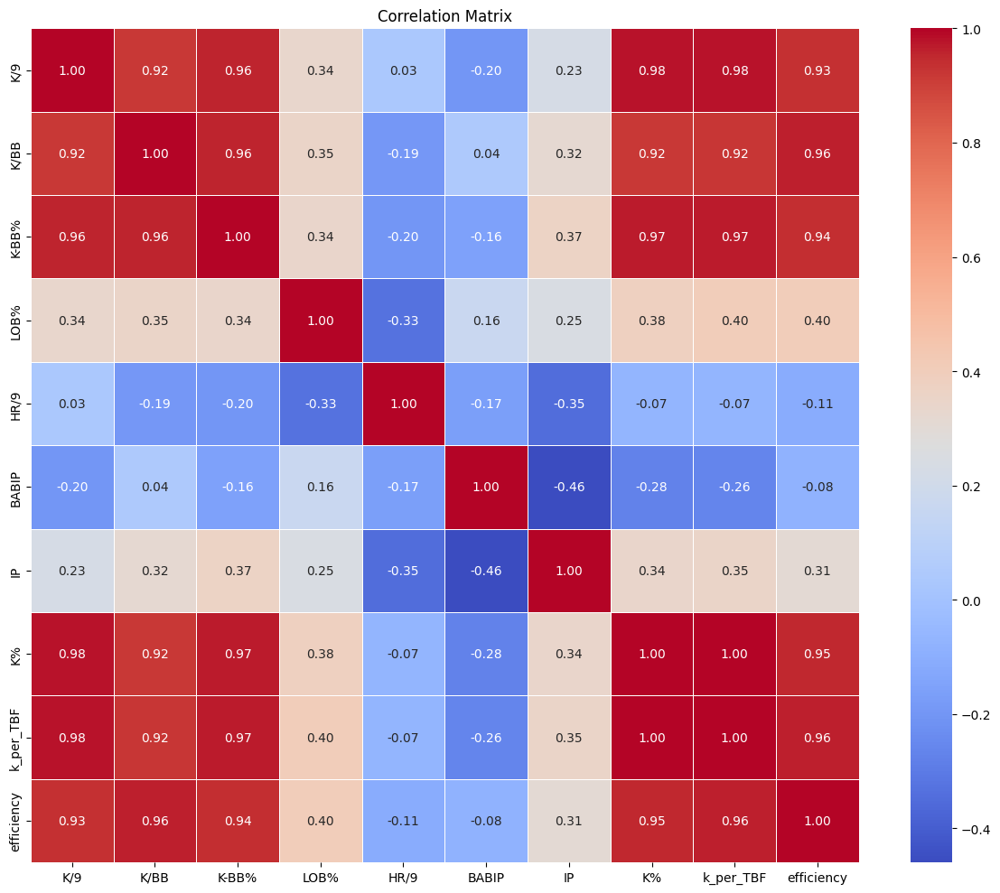


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0009
Test RMSE: 0.0480
Training R²: 1.0000
Test R²: -125.3220
Test MAE: 0.0478


<Figure size 1200x600 with 0 Axes>

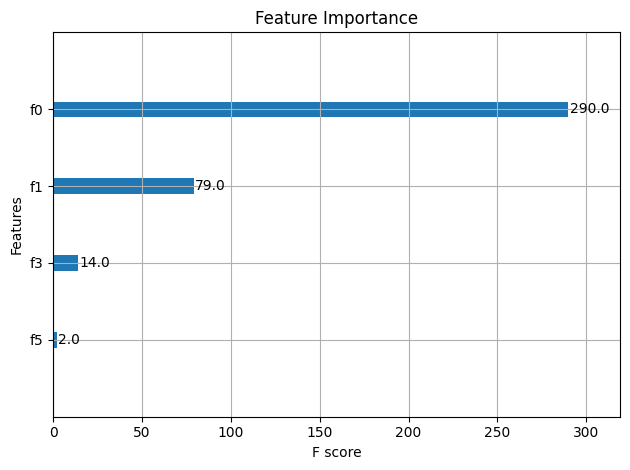


Sample Prediction for Next Game:
Predicted K%: 16.66%
Actual K%: 21.74%
Difference: 5.08%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.217391      0.166600
1   0.217391      0.166519
2   0.208333      0.166600

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs BAL.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Paul Skenes

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.998919
K-BB%         0.915150
K/9           0.892124
LOB%          0.676004
efficiency    0.575585
K/BB          0.291897
BABIP        -0.376134
IP           -0.549946
HR/9               NaN
Name: K%, dtype: float64


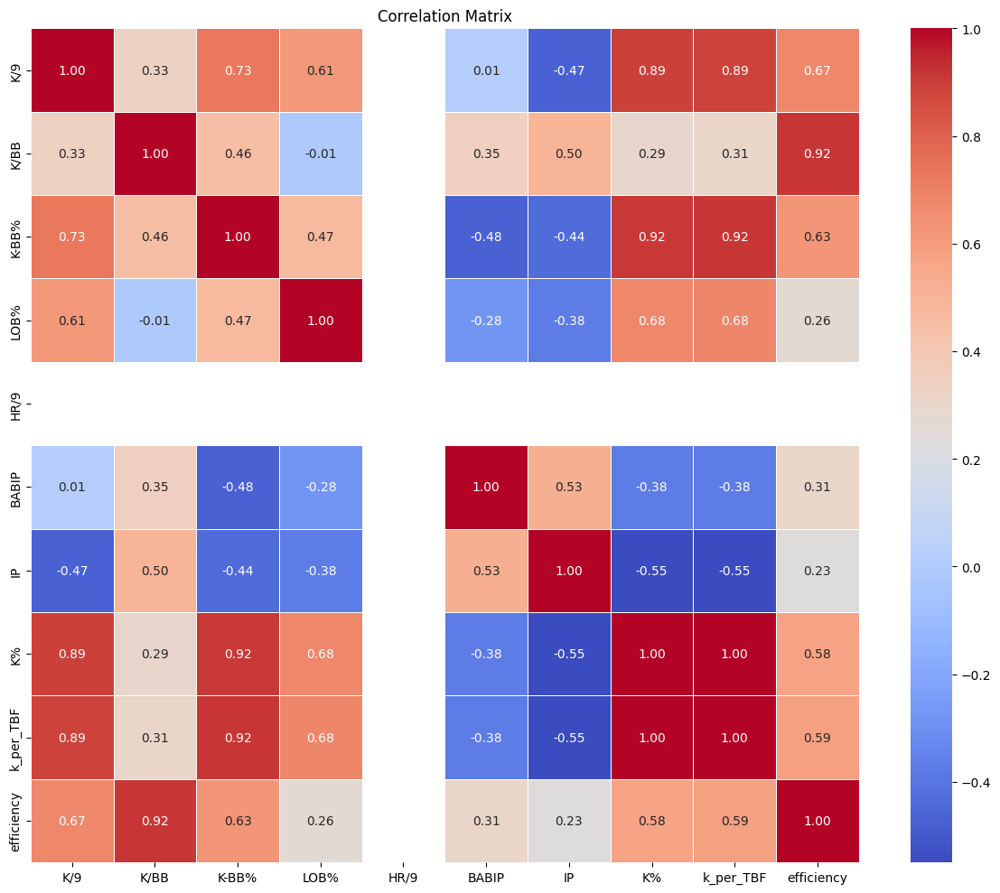


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0911
Training R²: 0.9999
Test R²: 0.2192
Test MAE: 0.0774


<Figure size 1200x600 with 0 Axes>

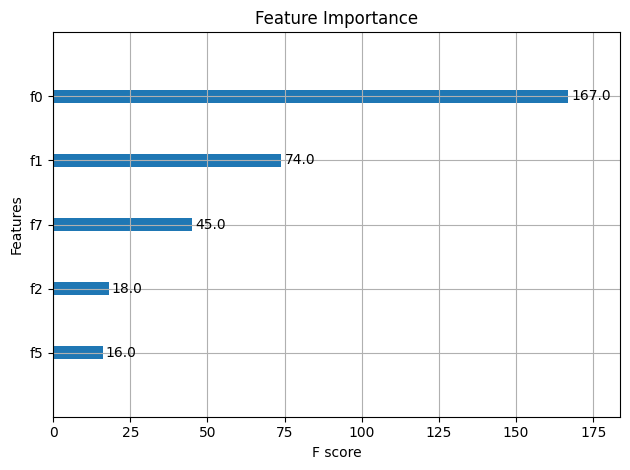


Sample Prediction for Next Game:
Predicted K%: 37.74%
Actual K%: 50.00%
Difference: 12.26%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.500000      0.377439
1   0.473684      0.374790
2   0.269231      0.280090

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP-4.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (12, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (12, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.997871
K/9           0.936129
K-BB%         0.801266
efficiency    0.788351
K/BB          0.726686
IP            0.347014
LOB%         -0.142886
BABIP        -0.389390
HR/9         -0.392247
Name: K%, dtype: float64


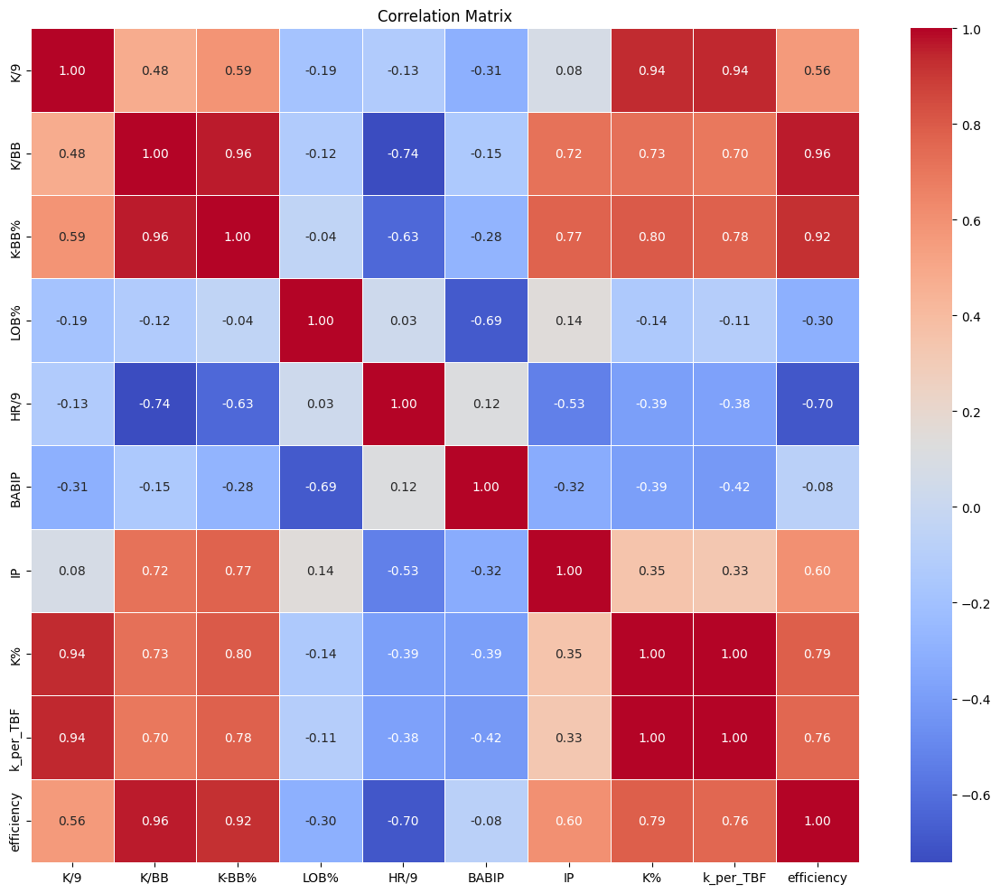


Training set: (9, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0007
Test RMSE: 0.0593
Training R²: 1.0000
Test R²: -1.6518
Test MAE: 0.0503


<Figure size 1200x600 with 0 Axes>

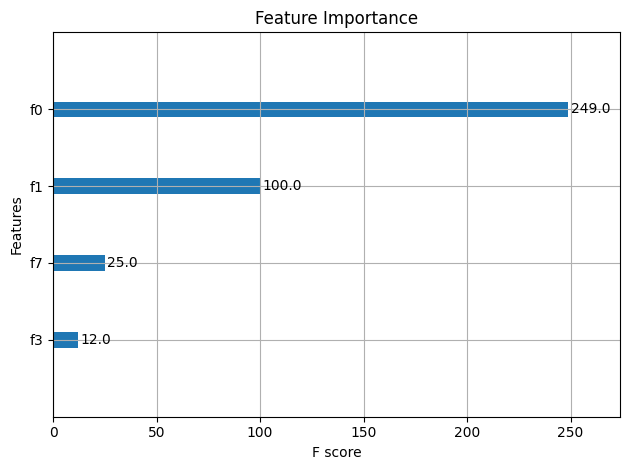


Sample Prediction for Next Game:
Predicted K%: 8.35%
Actual K%: 12.00%
Difference: 3.65%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.120000      0.083526
1   0.095238      0.001472
2   0.181818      0.161234

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs CLE-2.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (11, 15)

Feature correlations with FIP:
FIP              1.000000
xFIP             0.940436
BB/9             0.817817
BB%              0.784700
WHIP             0.707390
TBF              0.511932
AVG              0.454530
BABIP            0.309697
IP               0.263222
LOB%            -0.188301
K/9             -0.596105
K/BB            -0.606465
Efficiency      -0.674665
K%              -0.755741
K_per_TBF       -0.761318
K-BB%           -0.929455
HR/9                  NaN
HR_to_K_ratio         NaN
Name: FIP, dtype: float64


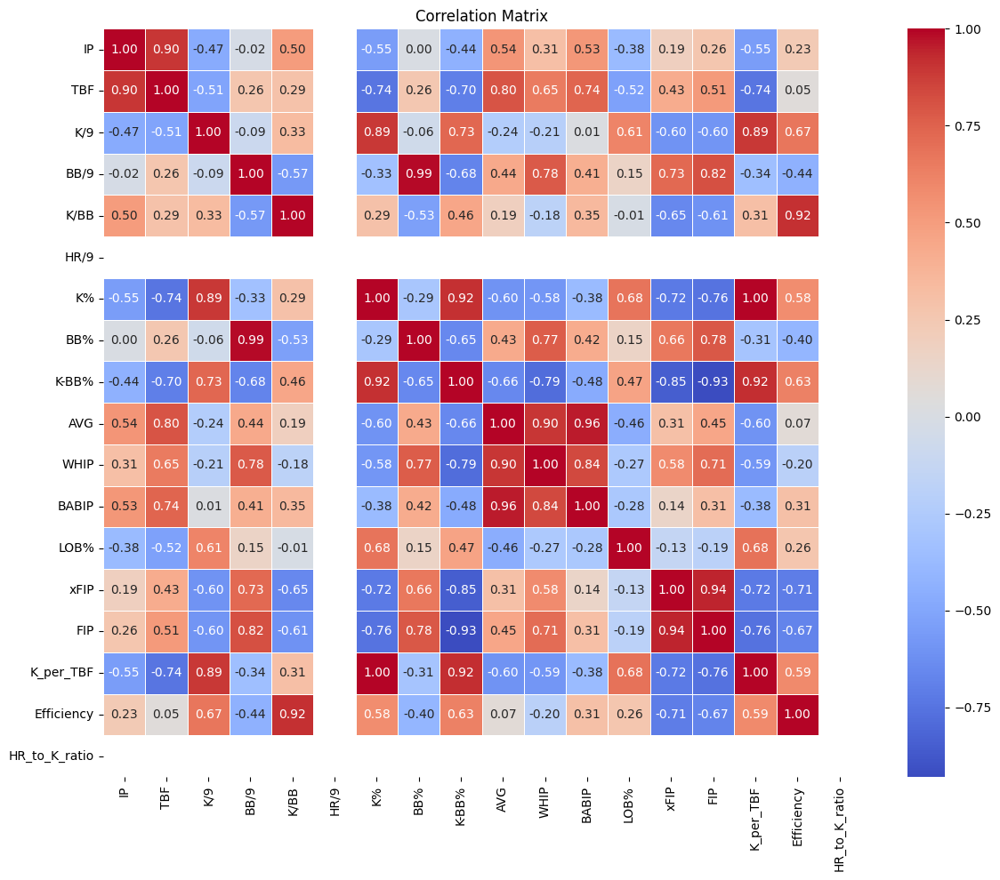


Training set: (8, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0046
Test RMSE: 0.3472
Training R²: 1.0000
Test R²: 0.3204
Test MAE: 0.2785


<Figure size 1200x600 with 0 Axes>

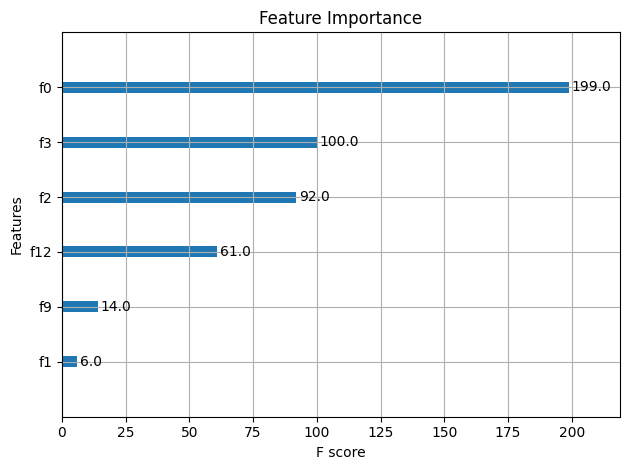


Sample Prediction for Next Game:
Predicted FIP: 0.67
Actual FIP: 0.17
Difference: 0.50

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    0.166480       0.669183
1    0.666480       0.669183
2    1.198049       1.528171

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP-4.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Ben Lively 라이블리

Data loaded successfully. Shape: (11, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (11, 15)

Feature correlations with FIP:
FIP              1.000000
AVG              0.886103
WHIP             0.872580
BABIP            0.836638
HR/9             0.801125
HR_to_K_ratio    0.766728
xFIP             0.723026
TBF              0.532516
BB/9             0.389821
BB%              0.274849
K/9              0.188721
Efficiency       0.184708
IP               0.090222
K/BB             0.039160
K%              -0.302654
K_per_TBF       -0.311850
K-BB%           -0.450056
LOB%            -0.595085
Name: FIP, dtype: float64


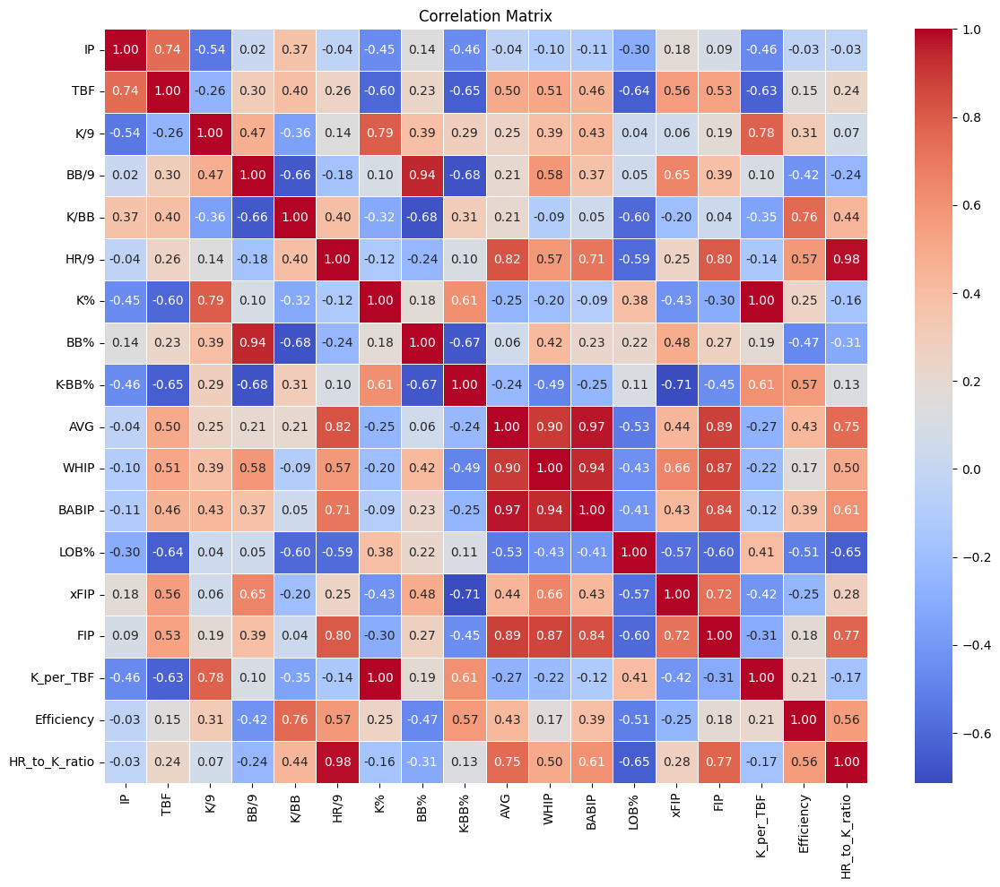


Training set: (8, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0074
Test RMSE: 1.4931
Training R²: 1.0000
Test R²: -18.3521
Test MAE: 1.2801


<Figure size 1200x600 with 0 Axes>

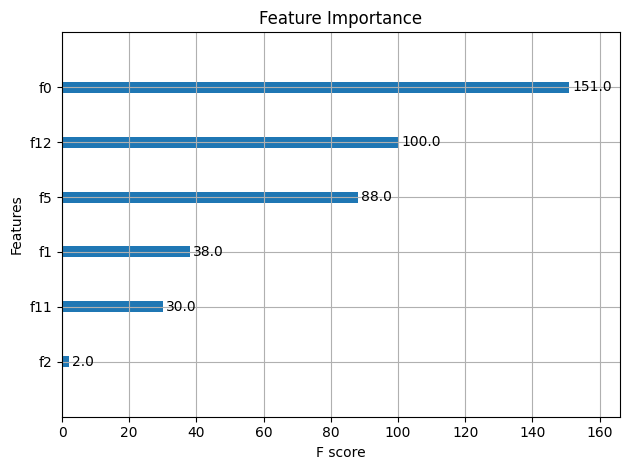


Sample Prediction for Next Game:
Predicted FIP: 4.43
Actual FIP: 2.97
Difference: 1.47

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    2.966480       4.432045
1    2.416480       4.531240
2    3.231383       2.971337

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -10.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.997136
K/9           0.793694
K-BB%         0.612191
LOB%          0.384872
efficiency    0.250633
BABIP        -0.090553
HR/9         -0.119082
K/BB         -0.315981
IP           -0.453631
Name: K%, dtype: float64


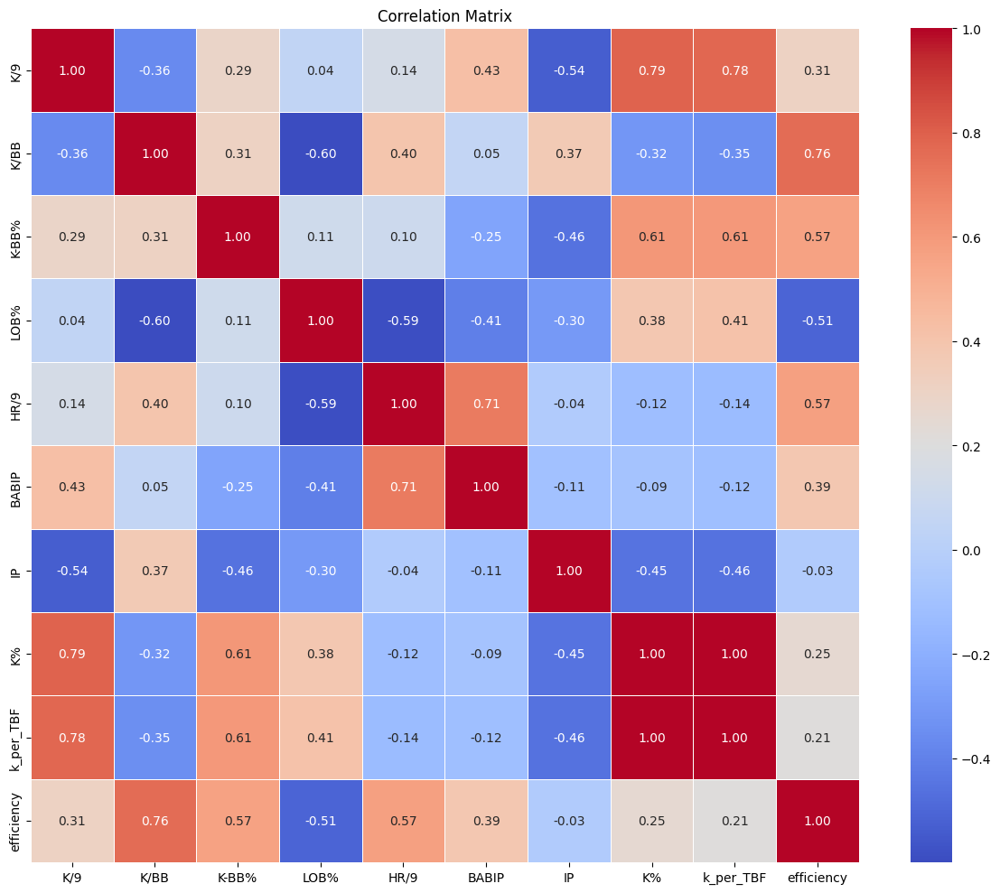


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0239
Training R²: 0.9999
Test R²: 0.8053
Test MAE: 0.0204


<Figure size 1200x600 with 0 Axes>

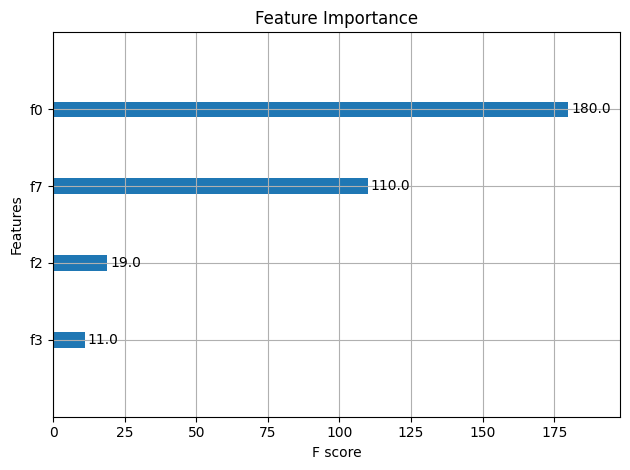


Sample Prediction for Next Game:
Predicted K%: 10.11%
Actual K%: 10.53%
Difference: 0.41%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.105263      0.101142
1   0.148148      0.125162
2   0.235294      0.201177

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -10.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (13, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (13, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.999506
K/9           0.953717
K-BB%         0.909968
efficiency    0.751269
K/BB          0.666517
HR/9          0.353661
IP            0.337104
LOB%          0.318592
BABIP         0.056748
Name: K%, dtype: float64


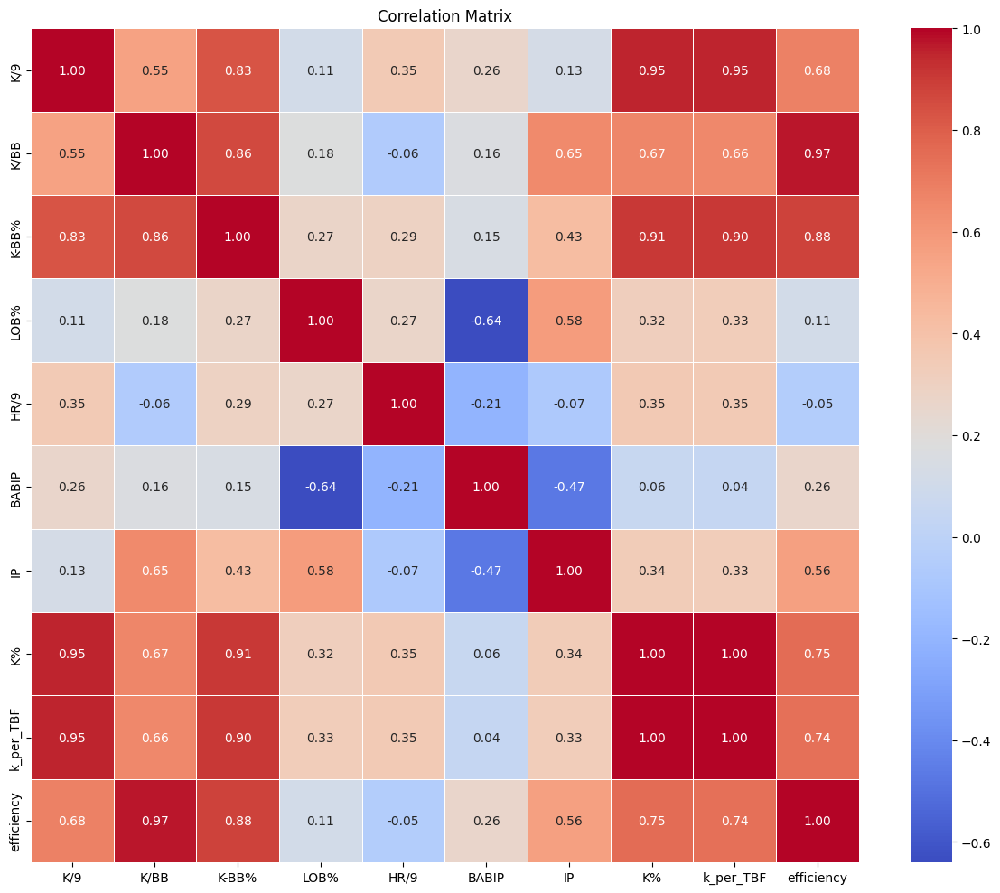


Training set: (10, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0104
Training R²: 1.0000
Test R²: 0.9080
Test MAE: 0.0100


<Figure size 1200x600 with 0 Axes>

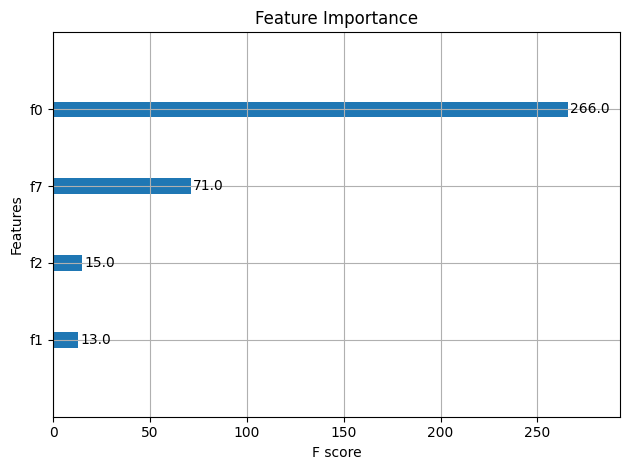


Sample Prediction for Next Game:
Predicted K%: 25.16%
Actual K%: 23.81%
Difference: 1.35%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.238095      0.251630
1   0.240000      0.232087
2   0.166667      0.157968

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs PIT.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#MacKenzie Gore

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.999633
K-BB%         0.977529
K/9           0.975090
efficiency    0.949591
K/BB          0.879162
IP            0.431319
LOB%          0.335837
BABIP        -0.461860
HR/9         -0.618789
Name: K%, dtype: float64


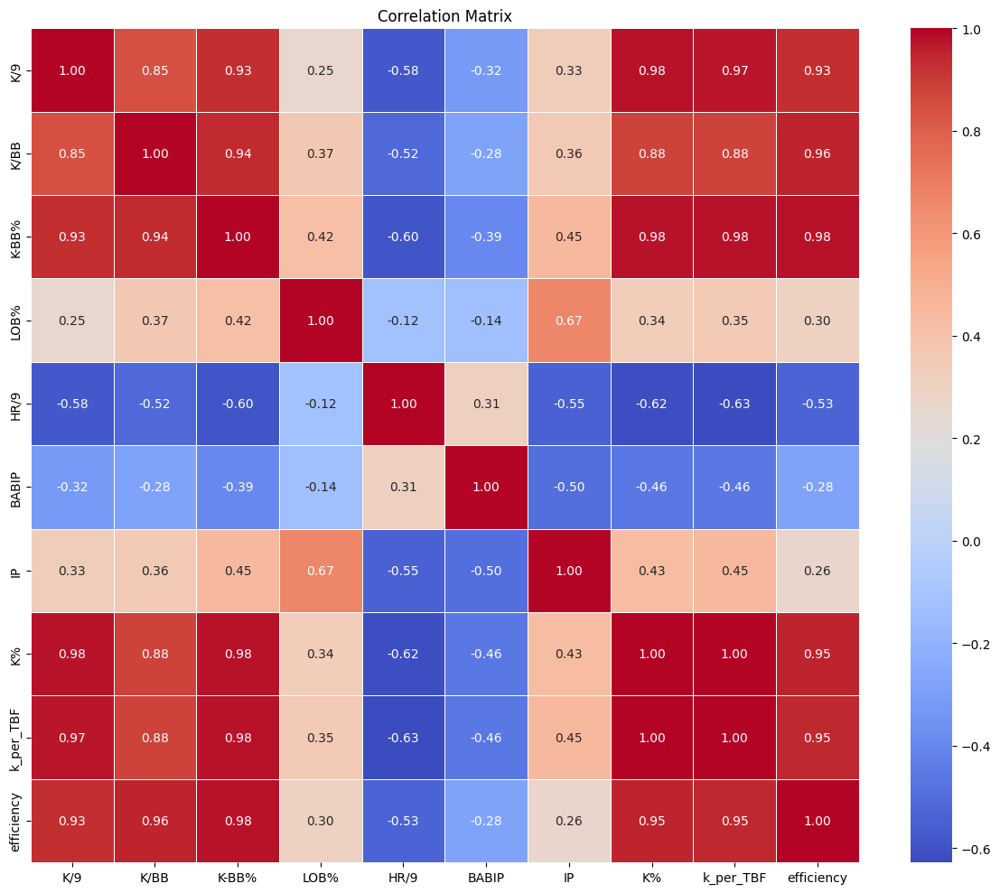


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0010
Test RMSE: 0.0791
Training R²: 1.0000
Test R²: 0.1648
Test MAE: 0.0636


<Figure size 1200x600 with 0 Axes>

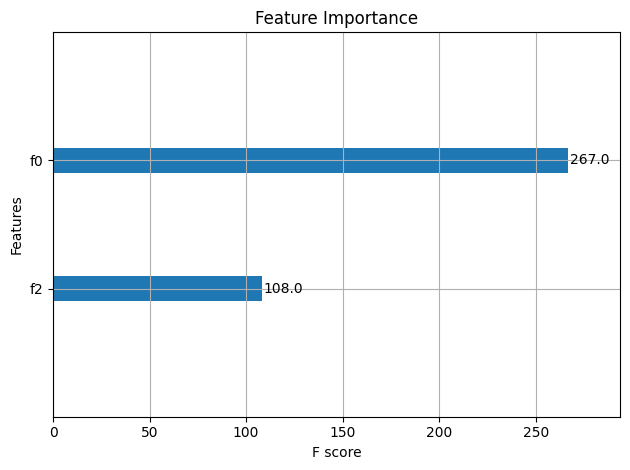


Sample Prediction for Next Game:
Predicted K%: 24.99%
Actual K%: 37.50%
Difference: 12.51%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.375000      0.249861
1   0.166667      0.177694
2   0.304348      0.249861

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '//content/Splits Leaderboard Data -11.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (11, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.998750
K-BB%         0.948026
efficiency    0.906215
K/BB          0.864562
K/9           0.853696
IP            0.230379
HR/9          0.162619
BABIP         0.158017
LOB%          0.086204
Name: K%, dtype: float64


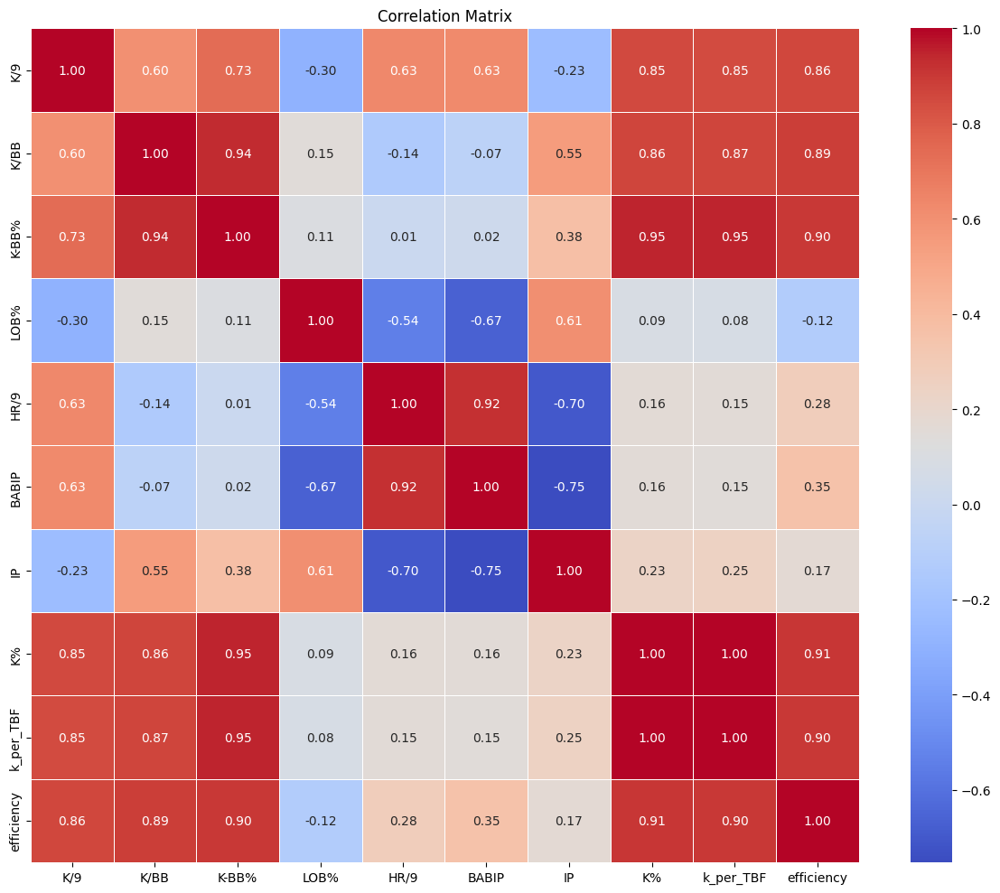


Training set: (8, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0973
Training R²: 0.9999
Test R²: 0.5566
Test MAE: 0.0943


<Figure size 1200x600 with 0 Axes>

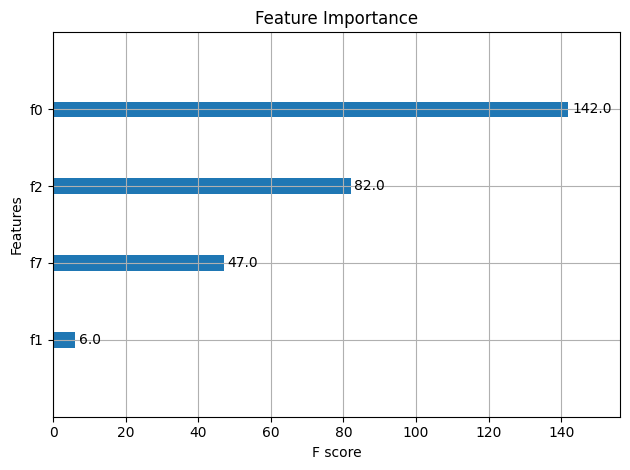


Sample Prediction for Next Game:
Predicted K%: 33.52%
Actual K%: 40.00%
Difference: 6.48%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.400000      0.335226
1   0.076923      0.200152
2   0.105263      0.200152

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs COL.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (11, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (11, 15)

Feature correlations with FIP:
FIP              1.000000
xFIP             0.921201
HR/9             0.900485
HR_to_K_ratio    0.885245
WHIP             0.798789
BB/9             0.691857
AVG              0.645577
TBF              0.564819
BB%              0.545214
BABIP            0.329961
LOB%            -0.368808
IP              -0.633643
K/9             -0.777107
Efficiency      -0.793781
K/BB            -0.804376
K%              -0.830461
K_per_TBF       -0.840610
K-BB%           -0.855685
Name: FIP, dtype: float64


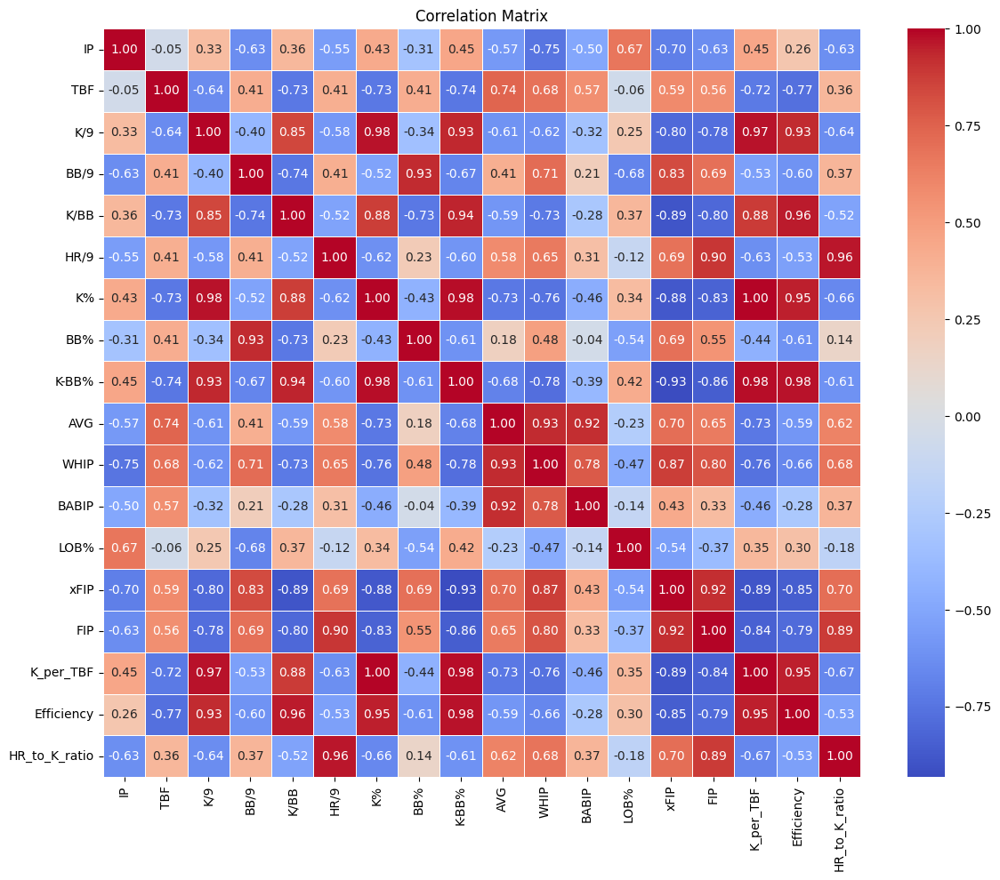


Training set: (8, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0154
Test RMSE: 1.2437
Training R²: 1.0000
Test R²: -11.9627
Test MAE: 1.0364


<Figure size 1200x600 with 0 Axes>

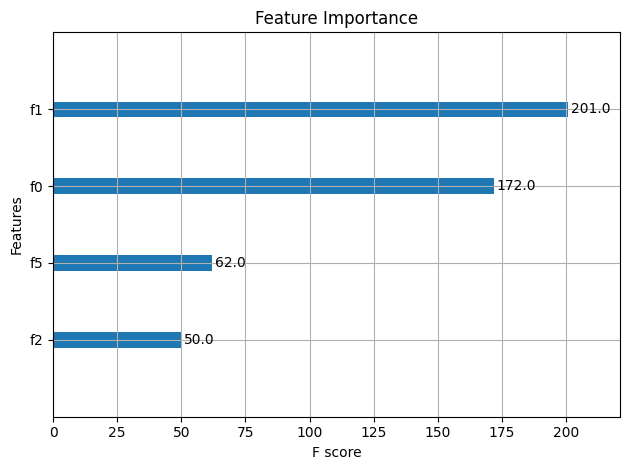


Sample Prediction for Next Game:
Predicted FIP: 2.20
Actual FIP: 4.17
Difference: 1.97

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    4.166480       2.198240
1    3.999813       4.329927
2    3.364716       4.175584

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -11.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Garrett Crochet

Data loaded successfully. Shape: (10, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (10, 15)

Feature correlations with FIP:
FIP              1.000000
WHIP             0.922874
HR_to_K_ratio    0.922122
HR/9             0.824624
AVG              0.790980
BB/9             0.787995
BB%              0.663011
BABIP            0.545582
xFIP             0.314677
TBF             -0.003799
K/9             -0.207734
IP              -0.401665
Efficiency      -0.524410
K%              -0.541694
LOB%            -0.547139
K_per_TBF       -0.569907
K-BB%           -0.600025
K/BB            -0.648047
Name: FIP, dtype: float64


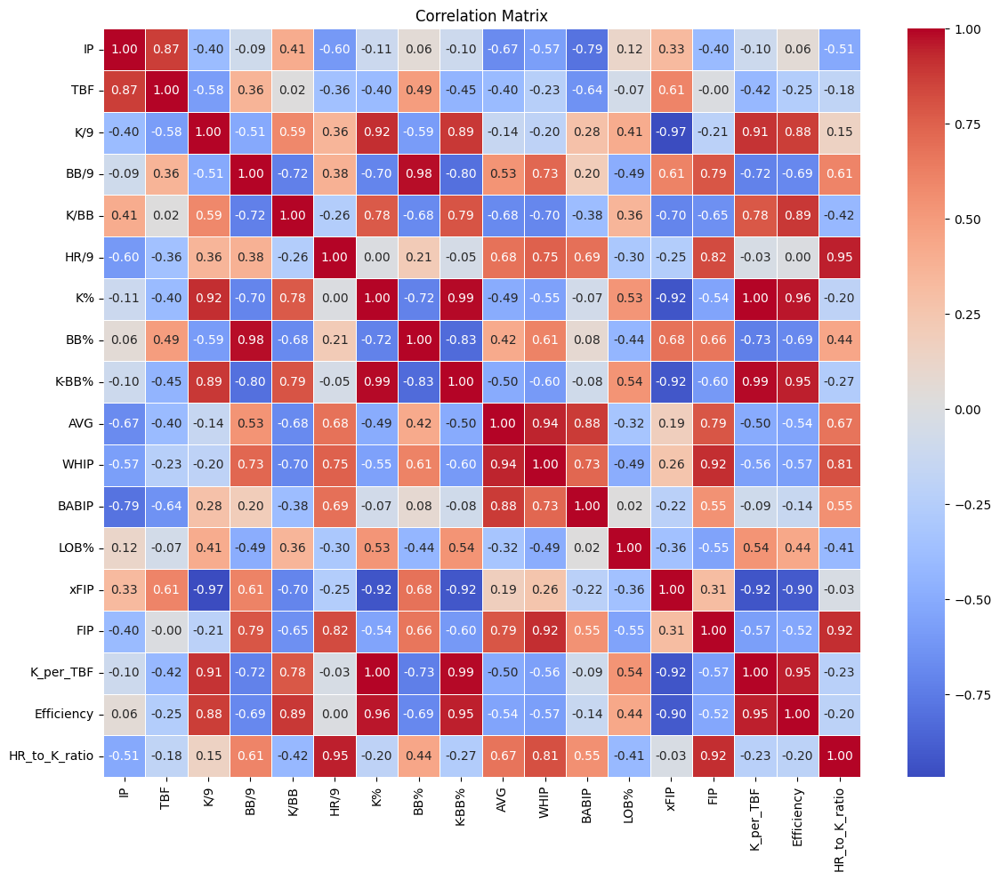


Training set: (8, 17), Test set: (2, 17)

Model Performance:
Training RMSE: 0.0145
Test RMSE: 4.6737
Training R²: 1.0000
Test R²: -6.5055
Test MAE: 4.4572


<Figure size 1200x600 with 0 Axes>

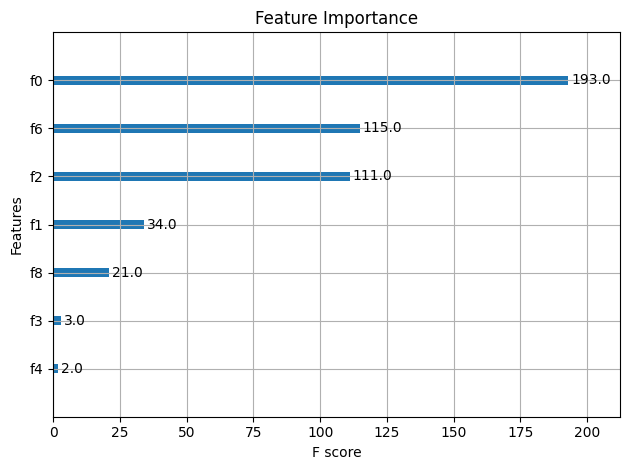


Sample Prediction for Next Game:
Predicted FIP: 2.63
Actual FIP: 5.68
Difference: 3.05

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    5.678442       2.627461
1    2.266480       8.129830

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP-5.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (10, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (10, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.996985
K-BB%         0.985844
efficiency    0.963259
K/9           0.920668
K/BB          0.777061
LOB%          0.530194
HR/9          0.001036
BABIP        -0.069097
IP           -0.106345
Name: K%, dtype: float64


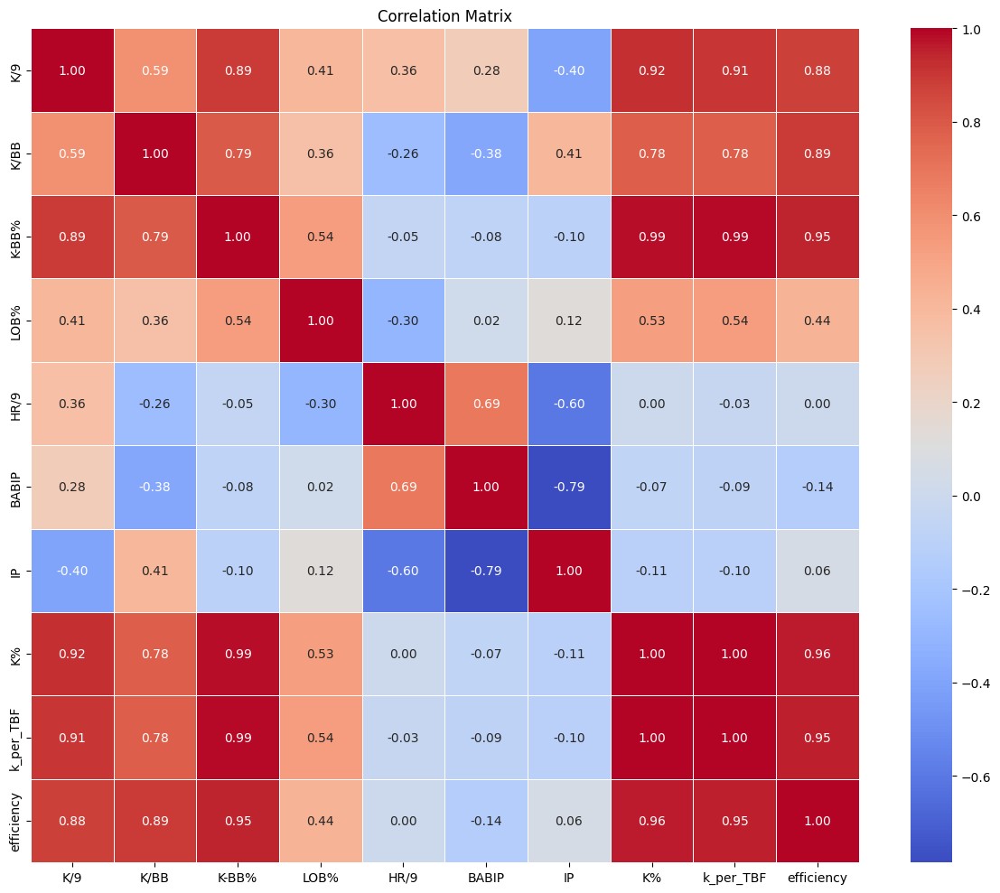


Training set: (8, 9), Test set: (2, 9)

Model Performance:
Training RMSE: 0.0008
Test RMSE: 0.0049
Training R²: 1.0000
Test R²: 0.9995
Test MAE: 0.0042


<Figure size 1200x600 with 0 Axes>

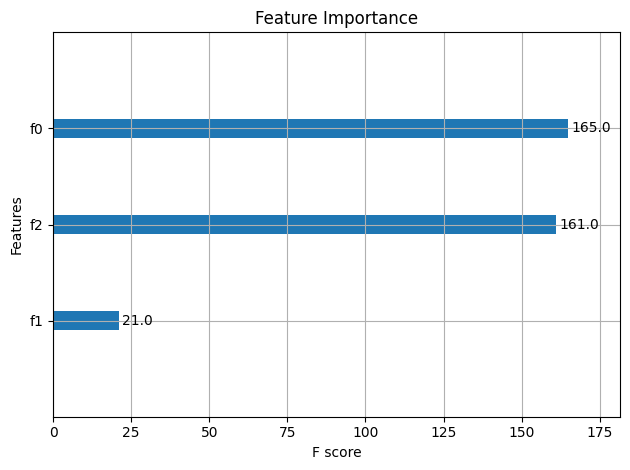


Sample Prediction for Next Game:
Predicted K%: 19.18%
Actual K%: 18.52%
Difference: 0.66%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.185185      0.191791
1   0.615385      0.613531

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP-5.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (12, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (12, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.998560
K/9           0.931587
K-BB%         0.927789
efficiency    0.827715
K/BB          0.822743
IP            0.254555
BABIP        -0.072004
HR/9         -0.388793
LOB%         -0.477687
Name: K%, dtype: float64


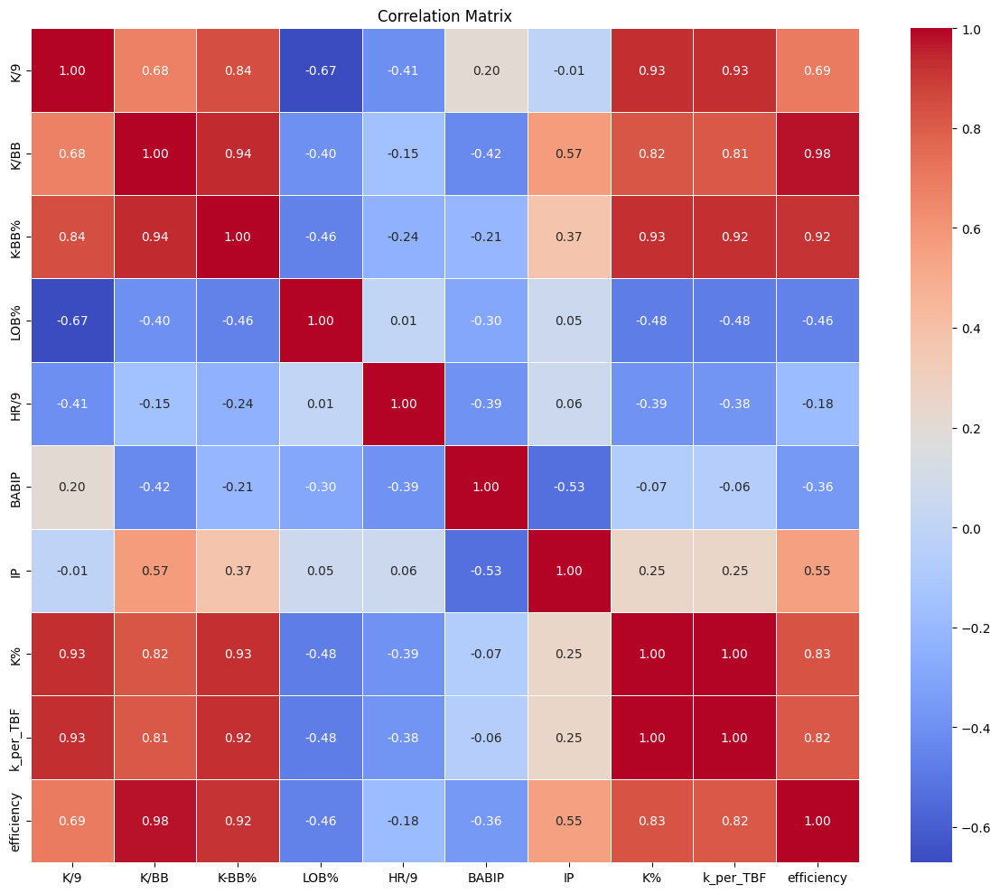


Training set: (9, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0005
Test RMSE: 0.1535
Training R²: 1.0000
Test R²: -2.4998
Test MAE: 0.1251


<Figure size 1200x600 with 0 Axes>

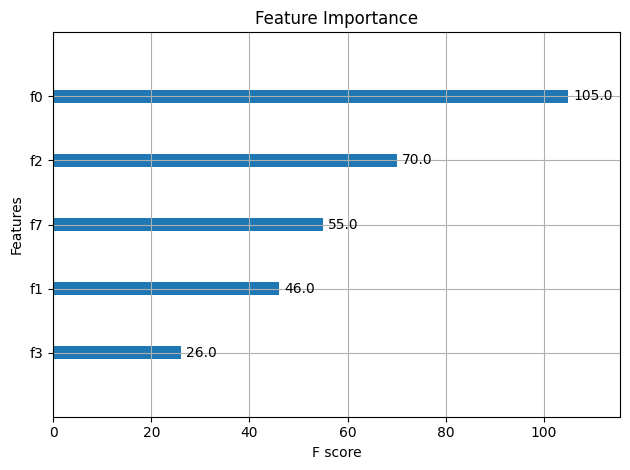


Sample Prediction for Next Game:
Predicted K%: 22.48%
Actual K%: 8.33%
Difference: 14.15%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.083333      0.224819
1   0.000000      0.224819
2   0.200000      0.190885

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs CHW.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Shane Baz

Data loaded successfully. Shape: (13, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (13, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.999570
K/9           0.983098
K-BB%         0.966110
efficiency    0.953243
K/BB          0.888616
LOB%          0.533954
IP            0.133442
HR/9          0.127240
BABIP         0.096914
Name: K%, dtype: float64


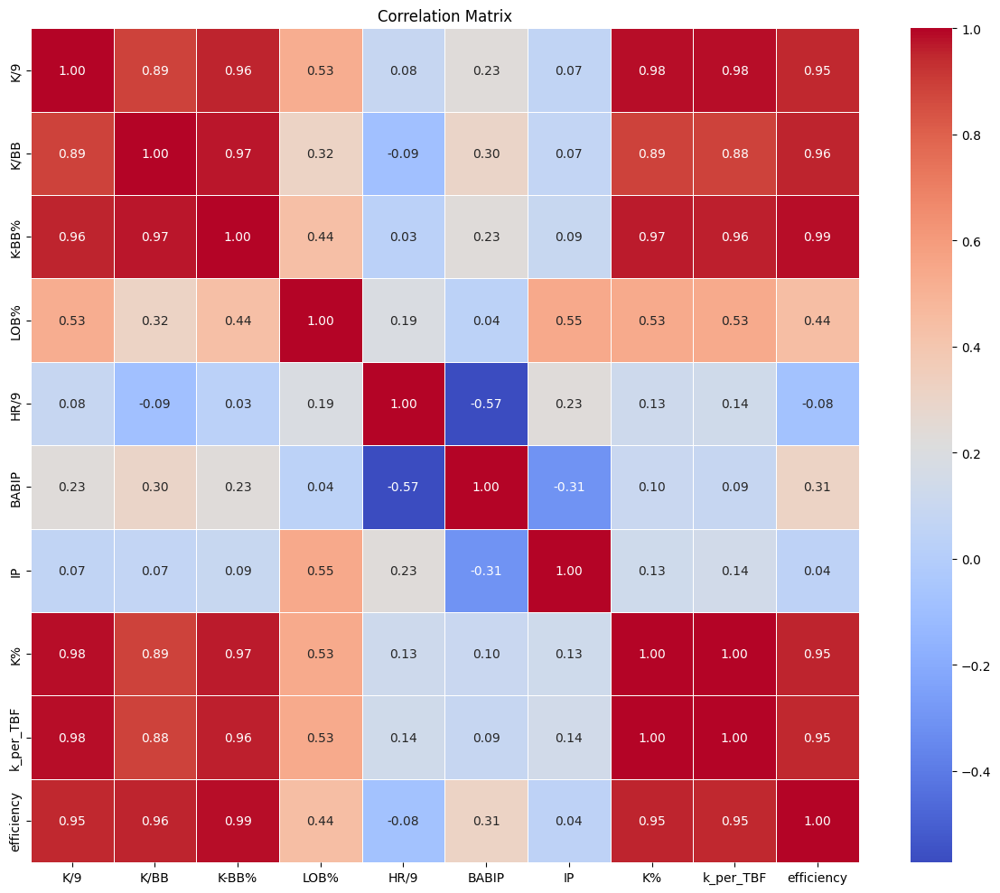


Training set: (10, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0008
Test RMSE: 0.0323
Training R²: 1.0000
Test R²: 0.3997
Test MAE: 0.0241


<Figure size 1200x600 with 0 Axes>

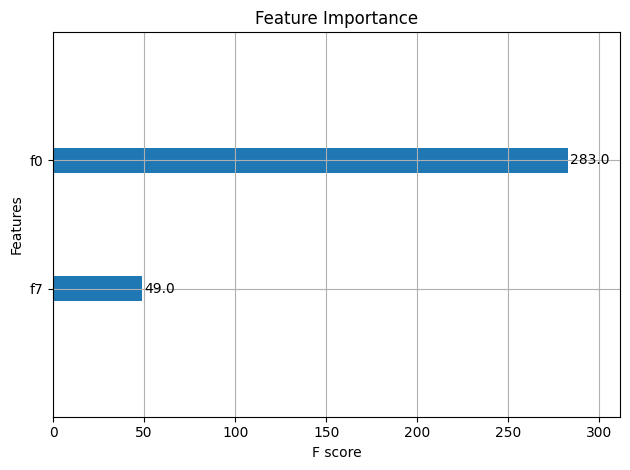


Sample Prediction for Next Game:
Predicted K%: 20.70%
Actual K%: 21.43%
Difference: 0.73%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.214286      0.206966
1   0.304348      0.249796
2   0.217391      0.206966

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -12.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (13, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (13, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.996256
K/9           0.954564
K-BB%         0.843864
efficiency    0.627349
LOB%          0.498051
K/BB          0.497997
IP            0.104950
BABIP        -0.228852
HR/9         -0.360658
Name: K%, dtype: float64


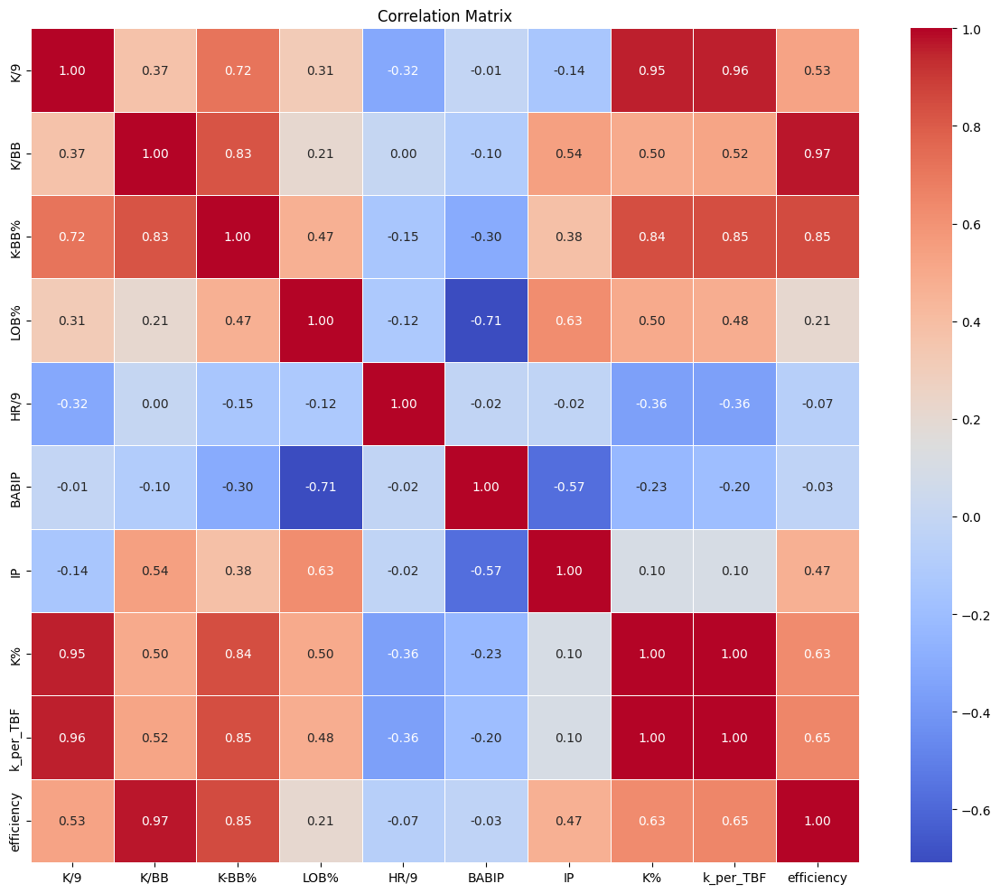


Training set: (10, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0414
Training R²: 1.0000
Test R²: 0.4728
Test MAE: 0.0328


<Figure size 1200x600 with 0 Axes>

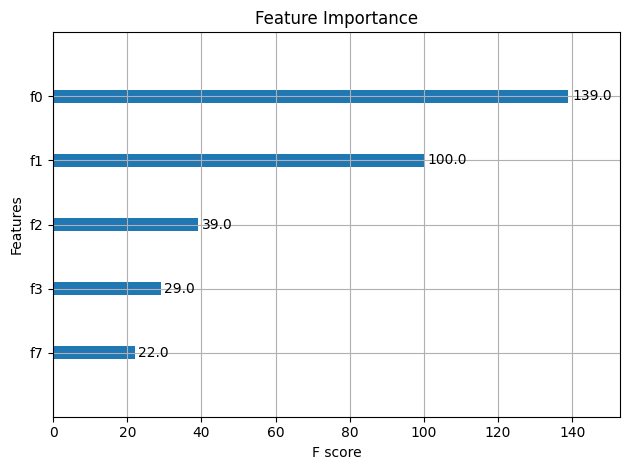


Sample Prediction for Next Game:
Predicted K%: 13.17%
Actual K%: 11.11%
Difference: 2.06%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.111111      0.131702
1   0.166667      0.156903
2   0.250000      0.318071

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs NYY.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (13, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (13, 15)

Feature correlations with FIP:
FIP              1.000000
HR_to_K_ratio    0.753012
xFIP             0.747975
BB/9             0.714874
BB%              0.713737
HR/9             0.678053
TBF              0.198074
WHIP             0.103469
IP               0.037635
LOB%            -0.221791
AVG             -0.313530
K_per_TBF       -0.580805
K%              -0.593283
BABIP           -0.600305
K/9             -0.619430
K-BB%           -0.687057
Efficiency      -0.743782
K/BB            -0.745376
Name: FIP, dtype: float64


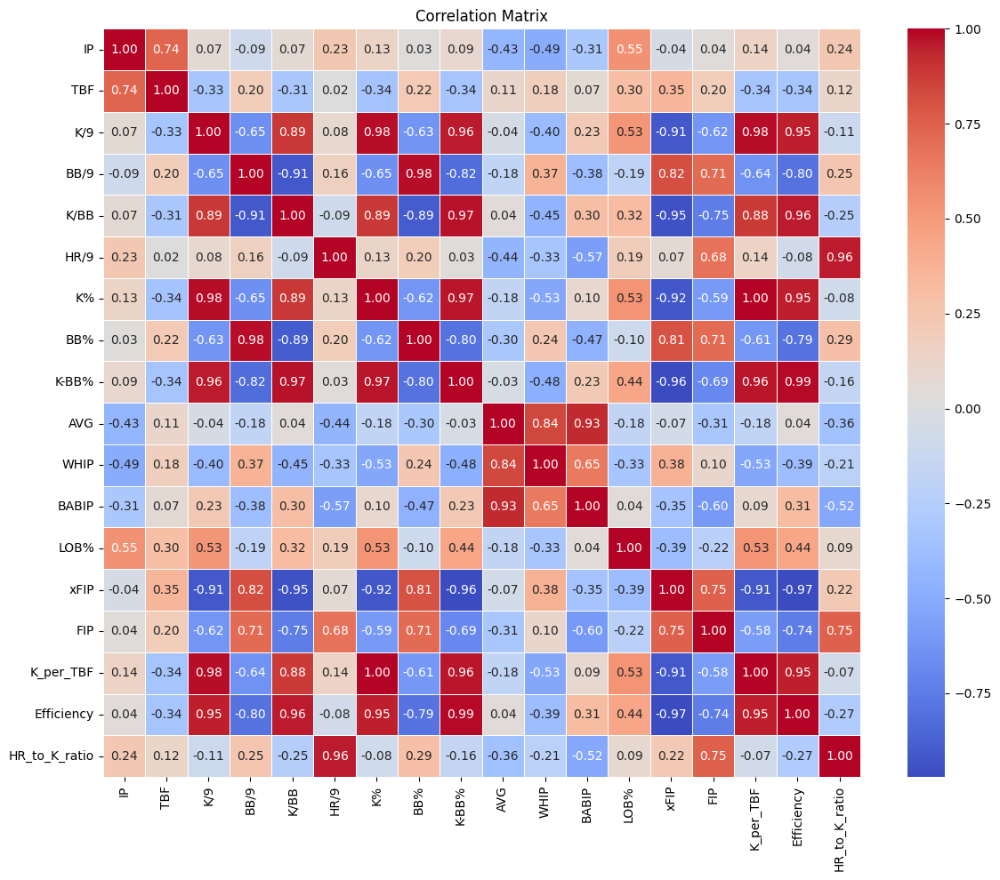


Training set: (10, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0091
Test RMSE: 2.2047
Training R²: 1.0000
Test R²: -1.6739
Test MAE: 1.9282


<Figure size 1200x600 with 0 Axes>

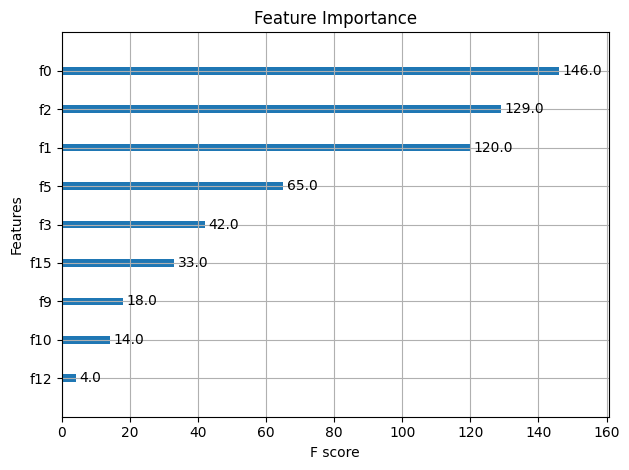


Sample Prediction for Next Game:
Predicted FIP: 4.47
Actual FIP: 4.89
Difference: 0.42

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    4.888526       4.469370
1    4.499813       1.741546
2    1.853980       4.461307

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -12.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Carlos Carrasco

Data loaded successfully. Shape: (12, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (12, 15)

Feature correlations with FIP:
FIP              1.000000
HR/9             0.952978
HR_to_K_ratio    0.936160
xFIP             0.425232
WHIP             0.412989
AVG              0.349633
LOB%             0.087224
BB/9             0.039791
K/9              0.015078
BB%             -0.001840
BABIP           -0.035361
Efficiency      -0.061579
K/BB            -0.098105
K-BB%           -0.112688
K%              -0.157130
K_per_TBF       -0.223668
TBF             -0.510564
IP              -0.584628
Name: FIP, dtype: float64


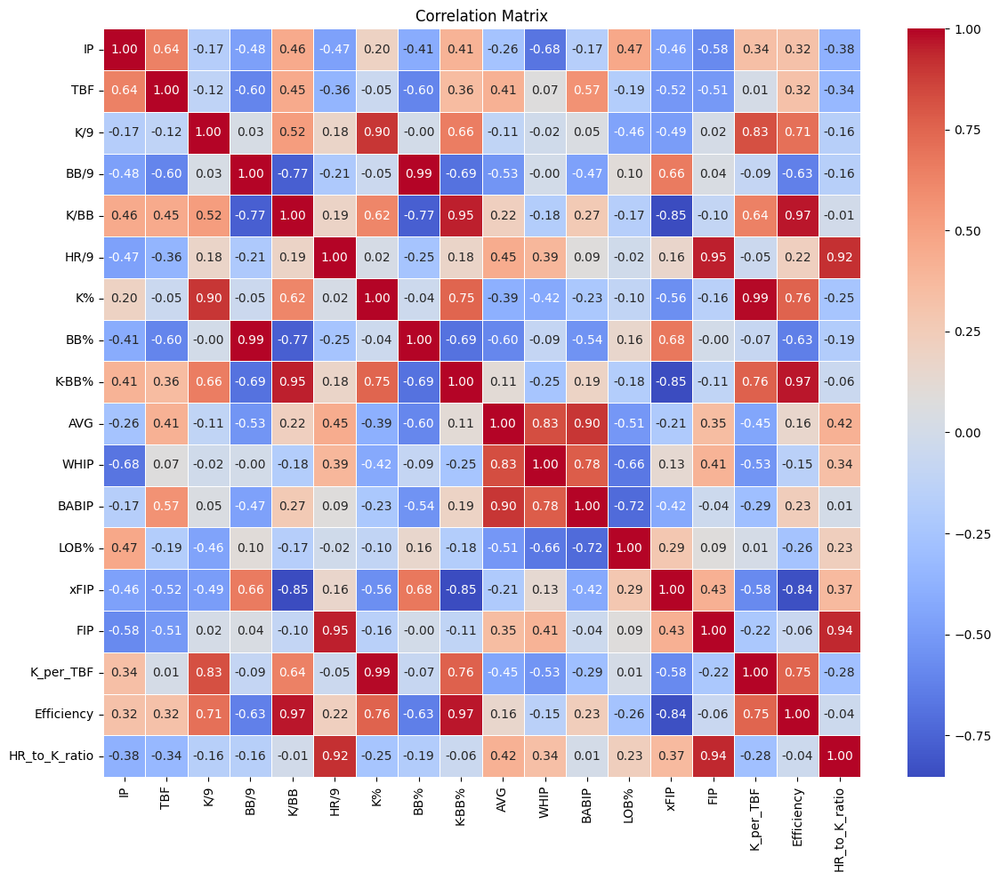


Training set: (9, 17), Test set: (3, 17)

Model Performance:
Training RMSE: 0.0069
Test RMSE: 1.9440
Training R²: 1.0000
Test R²: 0.7764
Test MAE: 1.6389


<Figure size 1200x600 with 0 Axes>

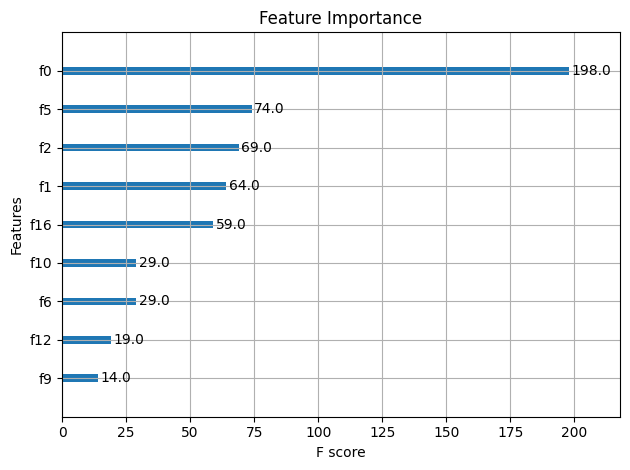


Sample Prediction for Next Game:
Predicted FIP: 8.24
Actual FIP: 11.34
Difference: 3.10

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0   11.339075       8.240922
1    2.281383       3.396787
2    2.999813       3.703103

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP-6.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (12, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (12, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.987072
K/9           0.901280
efficiency    0.758929
K-BB%         0.752798
K/BB          0.616744
IP            0.198413
HR/9          0.017807
LOB%         -0.104997
BABIP        -0.226518
Name: K%, dtype: float64


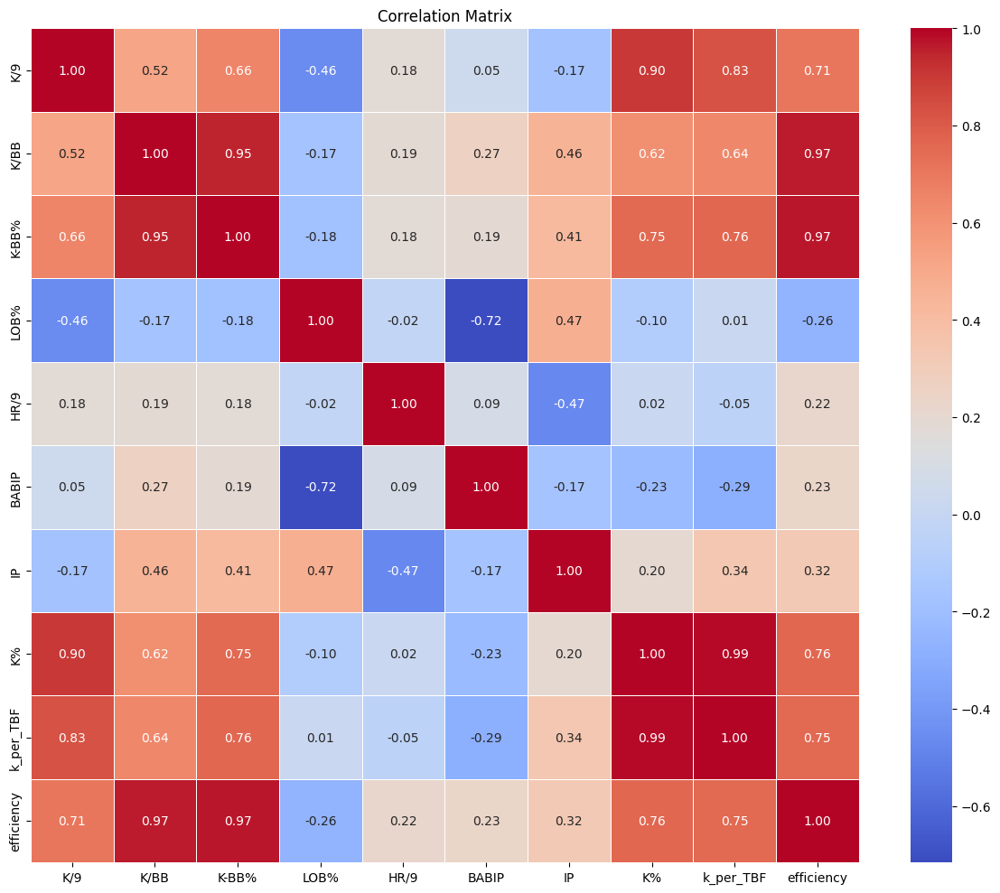


Training set: (9, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0269
Training R²: 0.9999
Test R²: 0.8606
Test MAE: 0.0241


<Figure size 1200x600 with 0 Axes>

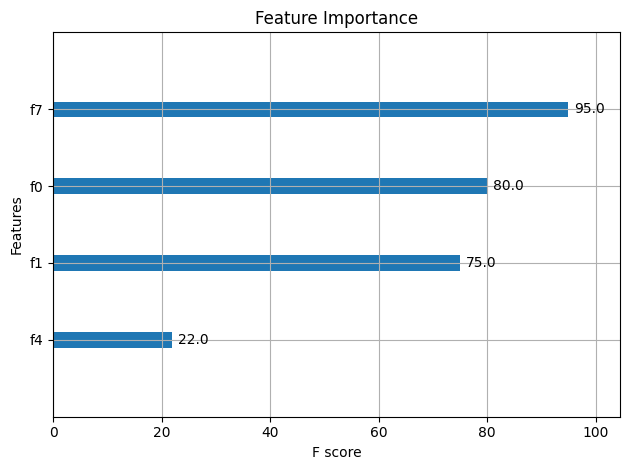


Sample Prediction for Next Game:
Predicted K%: 14.30%
Actual K%: 15.79%
Difference: 1.49%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.157895      0.143008
1   0.227273      0.186208
2   0.333333      0.316936

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP-6.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (13, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (13, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.996033
K/9           0.953046
efficiency    0.865911
K-BB%         0.810765
K/BB          0.518098
LOB%          0.477510
IP            0.318634
BABIP        -0.159266
HR/9         -0.331002
Name: K%, dtype: float64


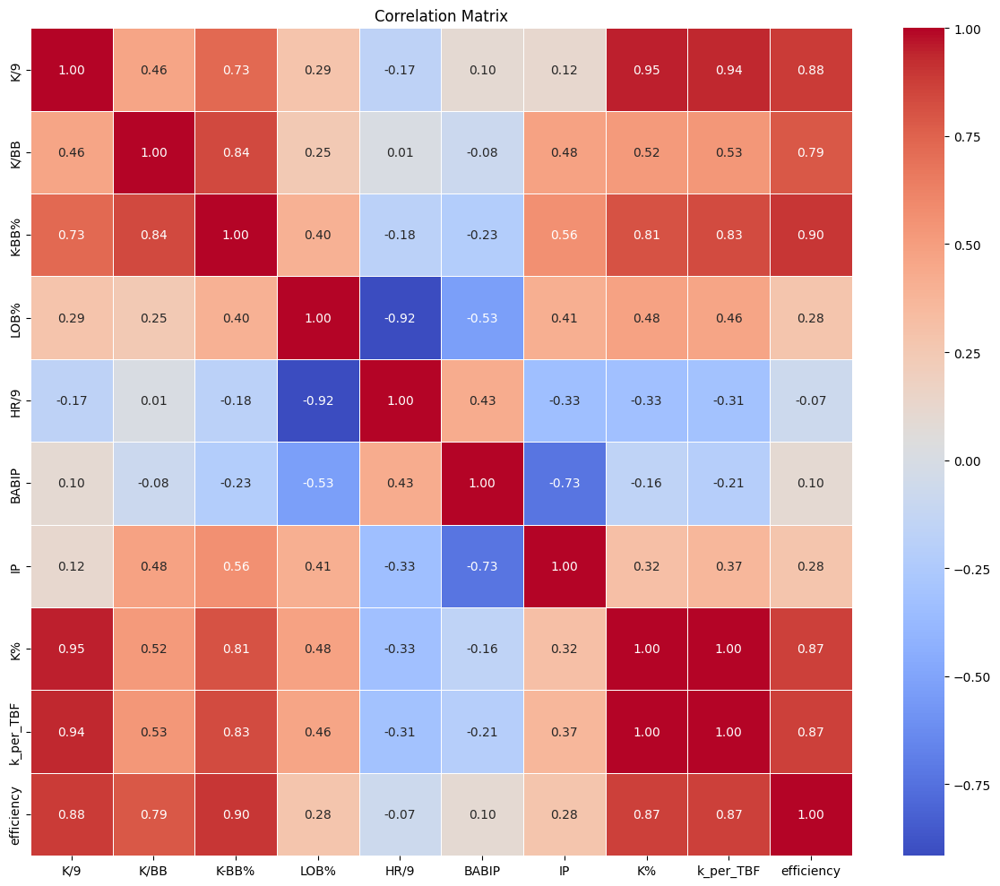


Training set: (10, 9), Test set: (3, 9)

Model Performance:
Training RMSE: 0.0005
Test RMSE: 0.0270
Training R²: 1.0000
Test R²: -1.3658
Test MAE: 0.0205


<Figure size 1200x600 with 0 Axes>

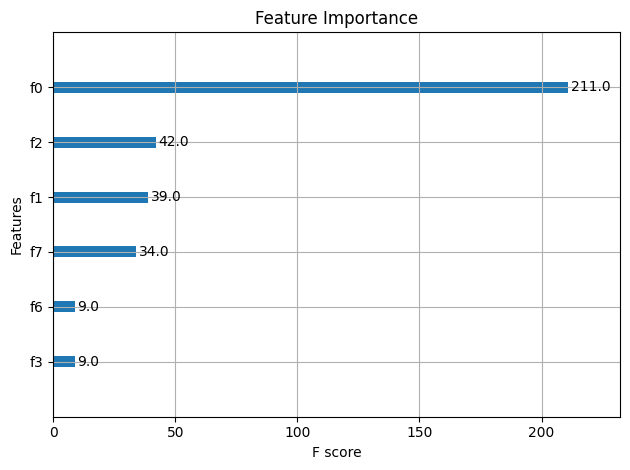


Sample Prediction for Next Game:
Predicted K%: 14.31%
Actual K%: 10.00%
Difference: 4.31%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.100000      0.143133
1   0.142857      0.143133
2   0.125000      0.143228

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data as SP vs TB.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Chris Sale

Data loaded successfully. Shape: (10, 17)

Missing values per column:
K/9      0
K/BB     0
K-BB%    0
LOB%     0
HR/9     0
BABIP    0
IP       0
K%       0
dtype: int64

Preprocessed data shape: (10, 8)

Feature correlations with K%:
K%            1.000000
k_per_TBF     0.990188
K/9           0.892327
K-BB%         0.715785
efficiency    0.638425
K/BB          0.347732
LOB%          0.251607
HR/9         -0.013458
BABIP        -0.085061
IP           -0.198016
Name: K%, dtype: float64


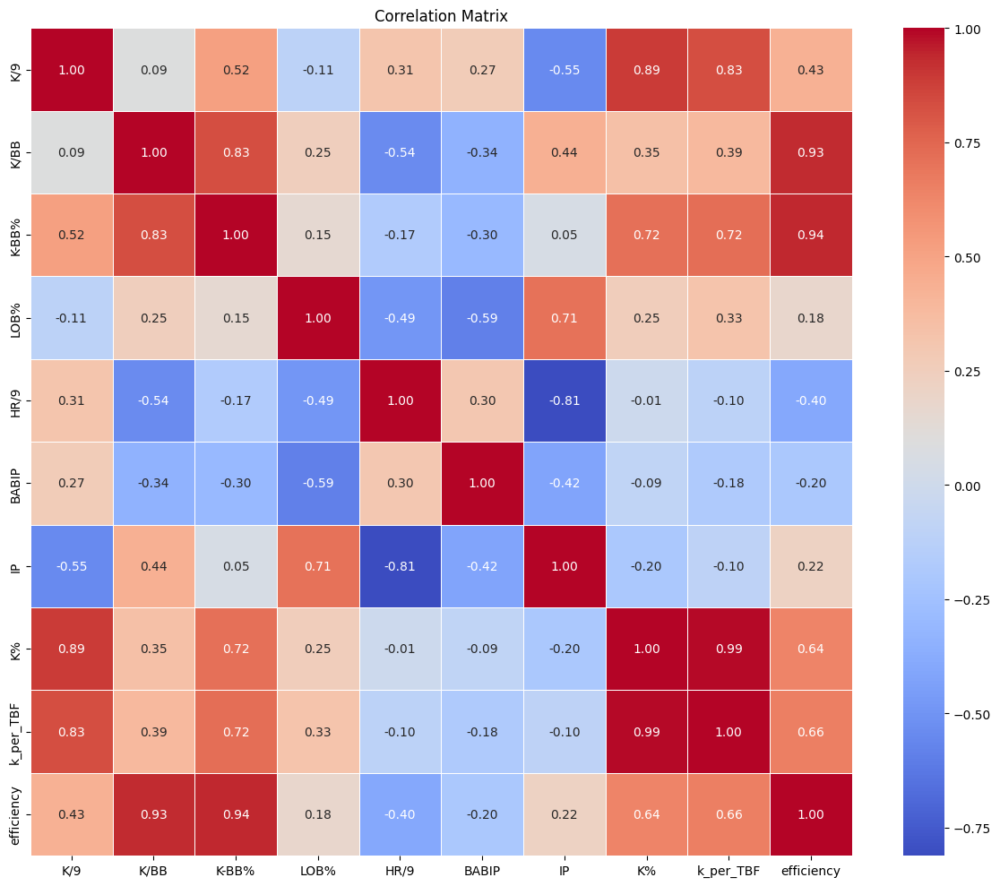


Training set: (8, 9), Test set: (2, 9)

Model Performance:
Training RMSE: 0.0006
Test RMSE: 0.0169
Training R²: 0.9999
Test R²: -0.0784
Test MAE: 0.0163


<Figure size 1200x600 with 0 Axes>

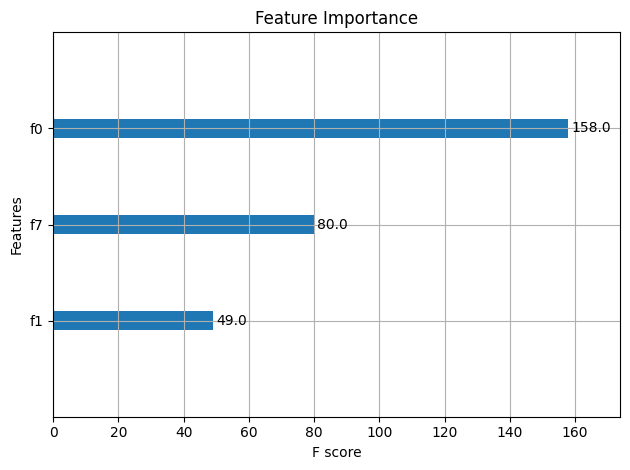


Sample Prediction for Next Game:
Predicted K%: 23.83%
Actual K%: 21.74%
Difference: 2.09%

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_K%  Predicted_K%
0   0.217391      0.238262
1   0.250000      0.238262

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -13.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Define Required Columns ==========
# Updated to use only the specified features
features = ['K/9', 'K/BB', 'K-BB%', 'LOB%', 'HR/9', 'BABIP', 'IP']
target = 'K%'

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Calculate k_per_TBF
# Note: We need TBF to calculate k_per_TBF, so we'll check if it exists or derive it
if 'TBF' in df.columns:
    model_df['k_per_TBF'] = df['K/9'] / (df['TBF'] / df['IP'] * 9)
else:
    # Approximating TBF if not available using K/9 and BB/9
    # This is a rough estimation
    if 'BB/9' in df.columns:
        estimated_TBF = df['IP'] * ((df['K/9'] + df['BB/9']) / 9 + 3)  # Rough estimate of batters faced
        model_df['k_per_TBF'] = df['K/9'] / (estimated_TBF / df['IP'] * 9)
    else:
        print("Warning: Cannot calculate k_per_TBF without TBF or BB/9 data")
        model_df['k_per_TBF'] = df['K/9'] / 9  # Fallback calculation

# Calculate efficiency
model_df['efficiency'] = model_df['K/BB'] * model_df['K/9']

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print("\nFeature correlations with K%:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict K% for a specific pitcher
def predict_next_game_k_percent(pitcher_data, model, scaler):
    """
    Predict next game K% for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted K% for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Make sure we have all required features
    for feature in X_train.columns:
        if feature not in pitcher_df.columns:
            if feature == 'k_per_TBF':
                # Calculate k_per_TBF if missing
                if 'TBF' in pitcher_df.columns:
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
                else:
                    # Approximate if TBF is not available
                    pitcher_df['k_per_TBF'] = pitcher_df['K/9'] / 9
            elif feature == 'efficiency':
                # Calculate efficiency if missing
                pitcher_df['efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
            else:
                raise ValueError(f"Missing required feature: {feature}")

    # Extract features in the correct order
    features_df = pitcher_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_k_percent = predict_next_game_k_percent(sample_pitcher, xgb_model, scaler)
actual_k_percent = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted K%: {predicted_k_percent:.2%}")
print(f"Actual K%: {actual_k_percent:.2%}")
print(f"Difference: {abs(predicted_k_percent - actual_k_percent):.2%}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_k_percent_model.json')
import joblib
joblib.dump(scaler, 'k_percent_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make K% predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Calculate required features if they don't exist
    if 'k_per_TBF' not in result_df.columns:
        if 'TBF' in result_df.columns:
            result_df['k_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
        else:
            # Approximate if TBF is not available
            result_df['k_per_TBF'] = result_df['K/9'] / 9

    if 'efficiency' not in result_df.columns:
        result_df['efficiency'] = result_df['K/BB'] * result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_K%'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_K%': y_test.head(5).values,
    'Predicted_K%': predictions_df['Predicted_K%'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

Data loaded successfully. Shape: (10, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (10, 15)

Feature correlations with FIP:
FIP              1.000000
HR/9             0.905992
HR_to_K_ratio    0.852807
xFIP             0.687719
BB/9             0.465521
WHIP             0.428187
BB%              0.410250
AVG              0.228618
K/9              0.158558
BABIP            0.132693
K%              -0.139844
K_per_TBF       -0.207612
LOB%            -0.323156
K-BB%           -0.430550
TBF             -0.558287
Efficiency      -0.644146
IP              -0.682967
K/BB            -0.736799
Name: FIP, dtype: float64


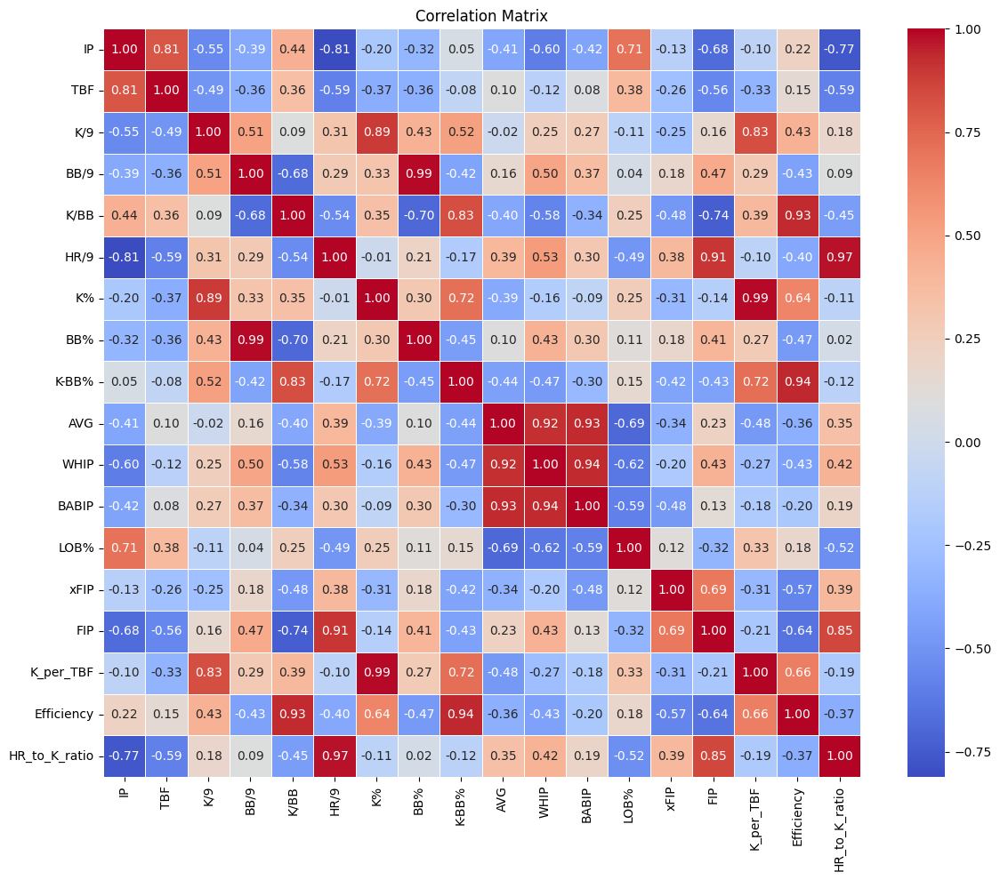


Training set: (8, 17), Test set: (2, 17)

Model Performance:
Training RMSE: 0.0071
Test RMSE: 1.3852
Training R²: 1.0000
Test R²: -0.9039
Test MAE: 1.2154


<Figure size 1200x600 with 0 Axes>

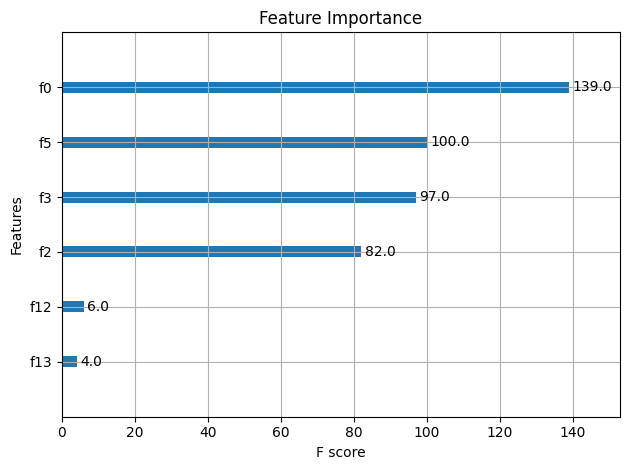


Sample Prediction for Next Game:
Predicted FIP: 5.55
Actual FIP: 3.67
Difference: 1.88

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0     3.67424       5.554049
1     1.66648       2.217527

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -13.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")

#Simeon Woods Richardson

Data loaded successfully. Shape: (10, 17)

Missing values per column:
IP       0
TBF      0
K/9      0
BB/9     0
K/BB     0
HR/9     0
K%       0
BB%      0
K-BB%    0
AVG      0
WHIP     0
BABIP    0
LOB%     0
xFIP     0
FIP      0
dtype: int64

Preprocessed data shape: (10, 15)

Feature correlations with FIP:
FIP              1.000000
HR/9             0.946924
WHIP             0.889049
HR_to_K_ratio    0.860336
AVG              0.708509
BABIP            0.624280
K/9              0.576956
BB/9             0.571101
xFIP             0.436697
BB%              0.114583
Efficiency      -0.086171
LOB%            -0.135863
K_per_TBF       -0.179268
K-BB%           -0.185956
K%              -0.198018
K/BB            -0.286173
TBF             -0.514175
IP              -0.705897
Name: FIP, dtype: float64


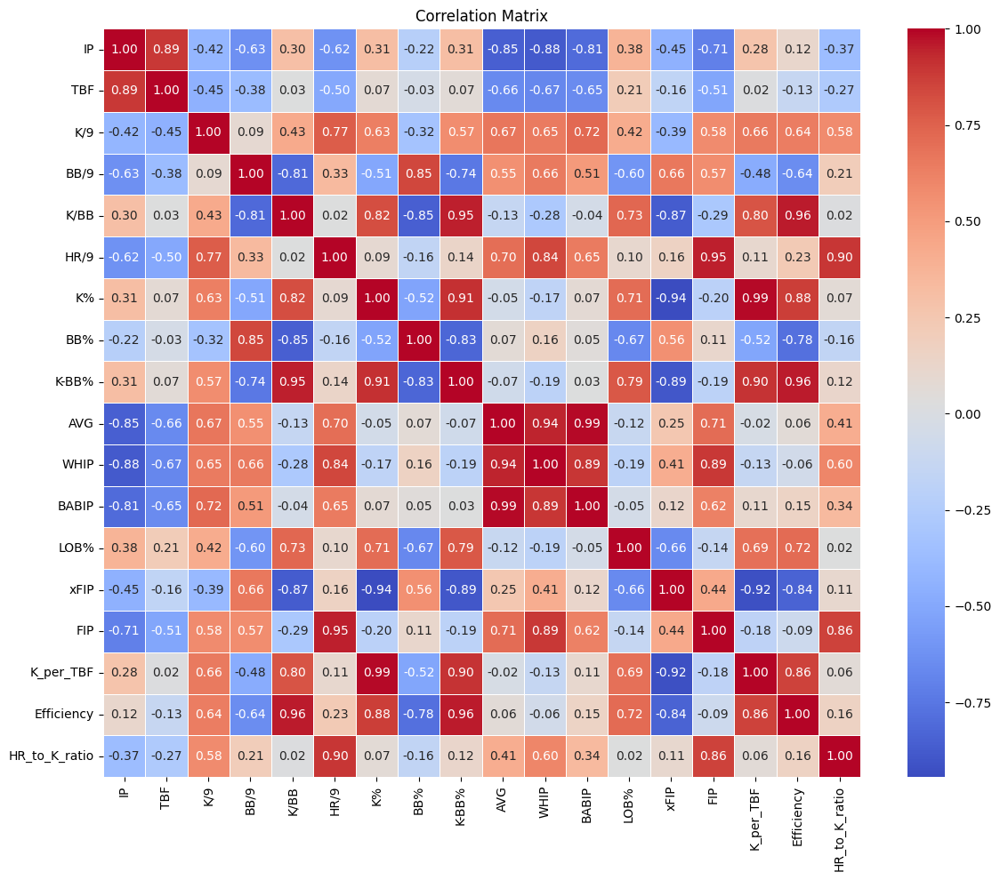


Training set: (8, 17), Test set: (2, 17)

Model Performance:
Training RMSE: 0.0228
Test RMSE: 1.8469
Training R²: 1.0000
Test R²: -7.4650
Test MAE: 1.7345


<Figure size 1200x600 with 0 Axes>

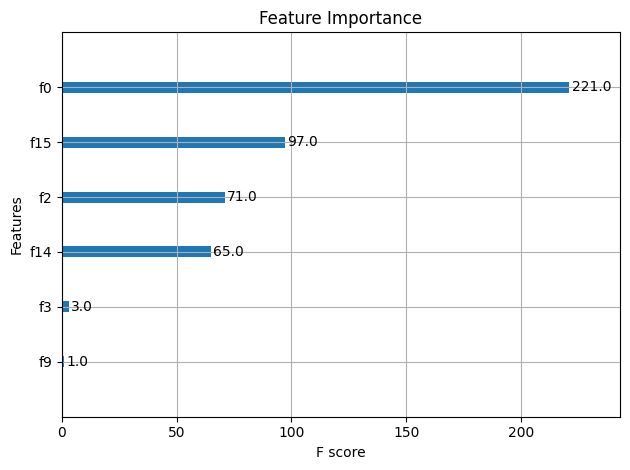


Sample Prediction for Next Game:
Predicted FIP: 4.23
Actual FIP: 5.33
Difference: 1.10

Model and scaler saved successfully.

Predictions for Upcoming Games:
   Actual_FIP  Predicted_FIP
0    5.325500       4.225174
1    6.595051       4.226280

Model ready for deployment!


In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# ========== Step 1: Load Data ==========
csv_path = '/content/Splits Leaderboard Data -14.csv'  # Replace with your actual file path
if not os.path.isfile(csv_path):
    raise FileNotFoundError(f"The file does not exist at the provided path: {csv_path}")

try:
    df = pd.read_csv(csv_path)
    print(f"Data loaded successfully. Shape: {df.shape}")
except Exception as e:
    raise Exception(f"Error reading CSV file: {e}")

# ========== Step 2: Verify Required Columns ==========
# Updated to use FIP as the target variable
target = 'FIP'
# Removing FIP from features since it's now the target
features = ['IP', 'TBF', 'K/9', 'BB/9', 'K/BB', 'HR/9', 'K%', 'BB%', 'K-BB%', 'AVG', 'WHIP', 'BABIP', 'LOB%', 'xFIP']

# Check if all required columns are present
required_columns = features + [target]
missing_columns = [col for col in required_columns if col not in df.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the data: {missing_columns}")

# ========== Step 3: Data Preprocessing ==========
# Convert percentage strings to floats if needed
percentage_cols = [col for col in df.columns if '%' in col]
for col in percentage_cols:
    if df[col].dtype == 'object':
        df[col] = df[col].str.rstrip('%').astype('float') / 100.0

# Handle missing values
print("\nMissing values per column:")
print(df[required_columns].isnull().sum())

# Fill missing values using appropriate strategy
for col in required_columns:
    if df[col].isnull().sum() > 0:
        # For this example, filling with median but could be customized
        df[col] = df[col].fillna(df[col].median())

# Clean the data: remove rows with extreme or invalid values
df = df[df['IP'] > 0]  # Ensure pitcher has pitched at least some innings

# Create a copy of the dataframe with only the features we need
model_df = df[required_columns].copy()
print(f"\nPreprocessed data shape: {model_df.shape}")

# ========== Step 4: Feature Engineering ==========
# Create any additional features that might help prediction
# Example: Calculate efficiency metrics
model_df['K_per_TBF'] = model_df['K/9'] / (model_df['TBF'] / model_df['IP'] * 9)
model_df['Efficiency'] = model_df['K/BB'] * model_df['K/9']
# New feature specifically for FIP prediction
model_df['HR_to_K_ratio'] = model_df['HR/9'] / model_df['K/9']

# Replace infinite values with NaN
model_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values (you can choose a different strategy if needed)
model_df.fillna(model_df.median(), inplace=True)

# ========== Step 5: Exploratory Data Analysis ==========
# Check correlation with target
corr = model_df.corr()[target].sort_values(ascending=False)
print(f"\nFeature correlations with {target}:")
print(corr)

# Plot correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = model_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

# ========== Step 6: Split Data ==========
# Split into features and target
X = model_df.drop(target, axis=1)
y = model_df[target]

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"\nTraining set: {X_train.shape}, Test set: {X_test.shape}")

# Optional: Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ========== Step 7: Train XGBoost Model ==========
# Initialize XGBoost model
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=4,
    random_state=42
)

# Train the model
xgb_model.fit(
    X_train_scaled,
    y_train,
    eval_set=[(X_train_scaled, y_train), (X_test_scaled, y_test)],
    verbose=False
)

# ========== Step 8: Hyperparameter Tuning ==========
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Use smaller grid for demonstration purposes
small_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5],
    'learning_rate': [0.01, 0.1]
}

# Run grid search (commented out to save computation time)
'''
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=small_param_grid,
    cv=3,
    scoring='neg_mean_squared_error',
    verbose=1
)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print("\nBest parameters found: ", grid_search.best_params_)
best_model = grid_search.best_estimator_
'''

# ========== Step 9: Model Evaluation ==========
# Make predictions
y_pred_train = xgb_model.predict(X_train_scaled)
y_pred_test = xgb_model.predict(X_test_scaled)

# Calculate metrics
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)
test_mae = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Training RMSE: {train_rmse:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")
print(f"Training R²: {train_r2:.4f}")
print(f"Test R²: {test_r2:.4f}")
print(f"Test MAE: {test_mae:.4f}")

# ========== Step 10: Feature Importance ==========
# Plot feature importance
plt.figure(figsize=(12, 6))
xgb.plot_importance(xgb_model, max_num_features=15)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

# ========== Step 11: Predictions for Next Game ==========
# Function to predict FIP for a specific pitcher
def predict_next_game_fip(pitcher_data, model, scaler):
    """
    Predict next game FIP for a pitcher based on their stats

    Args:
        pitcher_data: DataFrame row or dict containing pitcher's stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        Predicted FIP for the next game
    """
    # Convert input to DataFrame if it's a dict
    if isinstance(pitcher_data, dict):
        pitcher_df = pd.DataFrame([pitcher_data])
    else:
        pitcher_df = pd.DataFrame([pitcher_data])

    # Apply same feature engineering as training data
    pitcher_df['K_per_TBF'] = pitcher_df['K/9'] / (pitcher_df['TBF'] / pitcher_df['IP'] * 9)
    pitcher_df['Efficiency'] = pitcher_df['K/BB'] * pitcher_df['K/9']
    pitcher_df['HR_to_K_ratio'] = pitcher_df['HR/9'] / pitcher_df['K/9']

    # Scale features
    scaled_features = scaler.transform(pitcher_df)

    # Make prediction
    prediction = model.predict(scaled_features)[0]

    return prediction

# Example: Predicting for a sample pitcher
# (This would be replaced with actual pitcher data)
sample_pitcher = X_test.iloc[0].to_dict()  # Using first test set example
predicted_fip = predict_next_game_fip(sample_pitcher, xgb_model, scaler)
actual_fip = y_test.iloc[0]

print("\nSample Prediction for Next Game:")
print(f"Predicted FIP: {predicted_fip:.2f}")
print(f"Actual FIP: {actual_fip:.2f}")
print(f"Difference: {abs(predicted_fip - actual_fip):.2f}")

# ========== Step 12: Save Model ==========
# Save model and scaler for future use
xgb_model.save_model('mlb_pitcher_fip_model.json')
import joblib
joblib.dump(scaler, 'fip_scaler.pkl')

print("\nModel and scaler saved successfully.")

# ========== Step 13: Batch Predictions for Upcoming Games ==========
# Function to make predictions for multiple pitchers
def predict_upcoming_games(pitchers_df, model, scaler):
    """
    Make FIP predictions for multiple upcoming pitchers

    Args:
        pitchers_df: DataFrame with upcoming pitchers stats
        model: Trained XGBoost model
        scaler: Fitted StandardScaler

    Returns:
        DataFrame with original stats and predictions
    """
    # Create a copy to avoid modifying original
    result_df = pitchers_df.copy()

    # Apply same feature engineering
    result_df['K_per_TBF'] = result_df['K/9'] / (result_df['TBF'] / result_df['IP'] * 9)
    result_df['Efficiency'] = result_df['K/BB'] * result_df['K/9']
    result_df['HR_to_K_ratio'] = result_df['HR/9'] / result_df['K/9']

    # Extract features in the same order as training
    features_df = result_df[X_train.columns]

    # Scale features
    scaled_features = scaler.transform(features_df)

    # Make predictions
    predictions = model.predict(scaled_features)

    # Add predictions to result
    result_df['Predicted_FIP'] = predictions

    return result_df

# Example: Predict for a sample of upcoming pitchers
# (This would be replaced with actual upcoming pitcher data)
sample_upcoming_pitchers = X_test.head(5).copy()  # Using first 5 test examples
predictions_df = predict_upcoming_games(sample_upcoming_pitchers, xgb_model, scaler)

print("\nPredictions for Upcoming Games:")
comparison_df = pd.DataFrame({
    'Actual_FIP': y_test.head(5).values,
    'Predicted_FIP': predictions_df['Predicted_FIP'].values
})
print(comparison_df)

print("\nModel ready for deployment!")